In [12]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn import metrics
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

import skimage.io as skio
from skimage.color import rgb2gray, rgba2rgb, hsv2rgb
from skimage.transform import resize
import cv2

from tqdm.notebook import tqdm
import gdown
from glob import glob

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots



In [1]:
def glob_filepath(folder, ext, subfolder=False):
    """
    Get all the filepaths of a folder with a given extension without case sensitivity
    Args: folder -> the folder to search
          ext -> the extension of the files to search for
          subfolder -> whether to include subfolders in the search
    Return: list of filepaths
    """
    filepath = []

    if folder[-1] != '/' and folder != '':
        folder += '/'

    if not isinstance(ext, list):
        ext = [ext]

    # Modify folder path for recursive searching if subfolder is True
    if subfolder:
        folder = os.path.join(folder, '**')

    for item in ext:
        # Using glob with case-insensitive patterns
        filepath += glob(os.path.join(folder, '*.' + item), recursive=subfolder)
        filepath += glob(os.path.join(folder, '*.' + item.upper()), recursive=subfolder)
        filepath += glob(os.path.join(folder, '*.' + item.lower()), recursive=subfolder)

    return sorted(list(set(filepath)))


In [2]:

def plot_multiple_imgs(imgs, labels):

    fig = make_subplots(rows=1, cols=len(labels), subplot_titles=[f"{label} Image" for label in labels])
    for idx, _ in enumerate(labels, start=1):
        fig.add_trace(px.imshow(imgs[idx-1]).data[0], row=1, col=idx)

    fig.update_layout(height=600, width=600 * len(labels), showlegend=False)

    fig.show()

In [3]:
def sort_contours(contours, y_overlap_threshold=2, sort_by_topmost=False):
    # Group contours into rows based on y-coordinate overlap
    def group_into_rows(contours):
        rows = []
        current_row = [contours[0]]
        for contour in contours[1:]:
            _, current_y, _, current_h = cv2.boundingRect(current_row[-1])
            _, next_y, _, next_h = cv2.boundingRect(contour)
            
            # Check if the contour belongs to the current row
            if min(current_y + current_h, next_y + next_h) - max(current_y, next_y) > y_overlap_threshold:
                current_row.append(contour)
            else:
                rows.append(current_row)
                current_row = [contour]
        
        rows.append(current_row)
        return rows

    # Sort contours in each row based on x-coordinate
    def sort_row(row):
        return sorted(row, key=lambda contour: cv2.boundingRect(contour)[0])

    if sort_by_topmost:
        # Sort contours based on the top y-coordinate
        sorted_contours = sorted(contours, key=lambda contour: cv2.boundingRect(contour)[1])
    else:
        # First group contours into rows, then sort each row
        contours.sort(key=lambda contour: cv2.boundingRect(contour)[1]) # Sort by top y-coordinate
        rows = group_into_rows(contours)
        sorted_contours = [contour for row in rows for contour in sort_row(row)]

    return sorted_contours


In [4]:
from copy import deepcopy

import shutil

from sklearn.cluster import DBSCAN

def get_valid_contours(contours):
    """
    Separate valid and invalid contours based on their sizes.

    Parameters:
    contours (list): A list of contours to be separated.

    Returns:
    tuple: A tuple containing two lists: valid_contours and invalid_contours.
    """

    areas = []
    valid_contours = []
    invalid_contours = []

    for contour in contours:
        # Get the bounding rectangle
        x, y, w, h = cv2.boundingRect(contour)
        areas.append([w, h])  # Using width and height as features

    # Convert to numpy array for DBSCAN
    areas_np = np.array(areas)

    # Using DBSCAN for clustering
    db = DBSCAN(eps=0.5, min_samples=2, metric='euclidean').fit(areas_np)
    labels = db.labels_

    # Separate the contours based on the clustering
    for i, label in enumerate(labels):
        if label == -1:  # DBSCAN labels noise (outliers) as -1, assuming noise points are invalid contours
            invalid_contours.append(contours[i])
        else:
            valid_contours.append(contours[i])

    return valid_contours, invalid_contours

In [5]:

from sklearn.decomposition import PCA

def fit_pca(coordinates, n_components=2, pt1=None, pt2=None):
    pca_cord = pd.DataFrame(coordinates, columns=['y', 'x'])
    pca = PCA(n_components=n_components)
    pca.fit(coordinates)
    pca_coordinates = pca.transform(coordinates)
    pca_cord['pca_y'] = pca_coordinates[:, 0]
    pca_cord['pca_x'] = pca_coordinates[:, 1]

    points_pd = []
    for points in [pt1, pt2]:
        if points is not None:
            points = np.array(points)
            pca_cord_array = pca_cord[['y', 'x']].to_numpy()
            matches = np.all(pca_cord_array[:, None] == points, axis=2)
            mask = np.any(matches, axis=1)
            selected_points = pca_cord[mask]
            points_pd.append(selected_points)
    points_pd = pd.concat(points_pd).reset_index(drop=True)
    tip_pd = points_pd.loc[points_pd['pca_y'].idxmax()]
    point = tip_pd[['y', 'x']].astype('int').values.tolist()
    return point

def distance(pt1, pt2):
    return np.sqrt((pt1[0] - pt2[0])**2 + (pt1[1] - pt2[1])**2)

def find_extreme_points(coordinates):
    
    hull = cv2.convexHull(coordinates)
    # Function to calculate distance

    # Initialize maximum distance and corresponding points
    max_distance = 0
    point1 = None
    point2 = None

    # Iterate over all edges of the convex hull
    for i in range(len(hull)):
        for j in range(len(hull)):
            dist = distance(hull[i][0], hull[j][0])
            if dist > max_distance:
                max_distance = dist
                point1 = hull[i][0]
                point2 = hull[j][0]
    print()
    return point1, point2

In [6]:
def find_closest_to_tip(df, percentage):
    # Function to calculate Euclidean distance
    def euclidean_distance(point1, point2):
        return np.sqrt((point1[0] - point2[0])**2 + (point1[1] - point2[1])**2)

    # Initialize a column for distances and neighborhood
    df['Distance_to_Tip'] = np.nan
    df['Neighborhood'] = None

    for melon_index, group in df.groupby('Melon_Index'):
        # Extract the tip coordinates for the current group
        tip_coords = group[group['Tip'] == 'Tip'][['Col', 'Row']].values
        if len(tip_coords) > 0:
            tip_coords = tip_coords[0]

            # Calculate distance of each point in the group to the tip
            distances = group.apply(lambda row: euclidean_distance((row['Col'], row['Row']), tip_coords), axis=1)
            df.loc[group.index, 'Distance_to_Tip'] = np.round(distances, 2)

            # Determine the maximum allowed distance based on the percentage
            max_distance = np.percentile(distances, percentage)

            # Update the Neighborhood column
            df.loc[group.index, 'Neighborhood'] = distances.apply(lambda x: 'Near' if x <= max_distance else None)

    return df

In [7]:

#filepaths = glob_filepath(folder='../data/image/unprocessed_images/2022_Golden_Hills', ext=['jpg', 'jpeg'])


In [8]:
from pathlib import Path
import cv2
import numpy as np
from typing import Tuple, Optional, Union
import colour_demosaicing
from colour.io import convert_bit_depth

class ImageProcessor:
    def __init__(self):
        self.supported_formats = ['.jpg', '.jpeg', '.tiff', '.bmp']
    
    def convert_to_png(self, filepath: str, white_balance: bool = False, 
                      crop: bool = False, save: bool = True, save_dir: Optional[str] = None,
                      crop_params: Optional[Tuple[float, float, float, float]] = None) -> Tuple[np.ndarray, str]:
        """
        Convert image to PNG format with optional white balancing and cropping.
        """
        # Get input path and create output path
        input_path = Path(filepath)
        output_path = input_path.with_suffix('.png')
        
        # Read image
        img = cv2.imread(str(input_path), cv2.IMREAD_UNCHANGED)
        
        if white_balance:
            img = self._apply_white_balance(img)
            
        if crop:
            img = self._handle_cropping(img, crop_params)
            
        # Convert to PNG if not already
        if (input_path.suffix.lower() in self.supported_formats) and save:
            output_path = output_path if save_dir is None else Path(save_dir) / output_path.name
            cv2.imwrite(str(output_path), cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            
        return img, str(output_path)
    
    def _apply_white_balance(self, img: np.ndarray) -> np.ndarray:
        """
        Apply white balancing using Multi-Scale Retinex with Color Restoration
        """
        # Separate alpha channel if exists
        if img.shape[2] == 4:
            rgb = img[:,:,:3]
            alpha = img[:,:,3]
        else:
            rgb = img
            alpha = None
        
        # Convert to float32
        img_float = rgb.astype(np.float32) / 255.0
        
        # Split channels
        b, g, r = cv2.split(img_float)
        
        # Apply MSR to each channel
        sigma_list = [15, 80, 250]
        weights = [1/3] * 3
        
        def single_scale_retinex(img: np.ndarray, sigma: float) -> np.ndarray:
            gaussian = cv2.GaussianBlur(img, (0, 0), sigma)
            return np.log10(img + 1.) - np.log10(gaussian + 1.)
        
        # Process each channel
        balanced_channels = []
        for channel in [b, g, r]:
            msr = np.zeros_like(channel)
            for sigma, weight in zip(sigma_list, weights):
                msr += weight * single_scale_retinex(channel, sigma)
            
            # Normalize channel
            normalized = (msr - np.min(msr)) / (np.max(msr) - np.min(msr))
            balanced_channels.append(normalized)
        
        # Merge channels and scale
        balanced = cv2.merge(balanced_channels) * 255
        balanced = np.clip(balanced, 0, 255).astype(np.uint8)
        
        # Reattach alpha if existed
        if alpha is not None:
            balanced = cv2.cvtColor(balanced, cv2.COLOR_BGR2BGRA)
            balanced[:,:,3] = alpha
        
        return balanced
    
    def _handle_cropping(self, img: np.ndarray, 
                        crop_params: Optional[Tuple[float, float, float, float]]) -> np.ndarray:
        """
        Handle image cropping based on provided parameters
        """
        if crop_params is None:
            raise ValueError("You must provide crop parameters if crop is True.")
            
        if np.all(np.array(crop_params) < 1):
            x, y, w, h = [int(crop_params[i] * img.shape[(i+1) % 2]) for i in range(4)]
            return self._crop_image(img, x, y, w, h)
        return img
    
    def _crop_image(self, img: np.ndarray, x: int, y: int, w: int, h: int) -> np.ndarray:
        """
        Crop image using provided coordinates
        """
        return img[y:y+h, x:x+w]

In [9]:
from dataclasses import dataclass
@dataclass
class MelonProcessor:
    filepath: str
    adaptive_thresh: bool = False
    cnt_width: int = 100
    cnt_height: int = 50
    white_balance: bool = False
    padding: bool = True
    padding_percentage: int = 5
    sort_by_topmost: bool = False
    y_overlap_threshold: int = 20
    crop: bool = False
    crop_params: tuple = None
    save: bool = True # was True
    save_dir: str = './output'
    by_max_area: bool = True
    pca: bool = False
    
    def __post_init__(self):
        self.image_processor = ImageProcessor()
        self.folder_dir = self._setup_output_directory()
        self.image, self.image_path = self._load_image()
        self.tip_list = []

        
    def _load_image(self):
        """Load and prepare the image with preprocessing"""
        image, image_path = self.image_processor.convert_to_png(
            filepath=self.filepath,
            white_balance=self.white_balance,
            crop=self.crop, save=self.save, save_dir=self.folder_dir,
            crop_params=self.crop_params
        )
        
        if image.shape[2] < 4:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2BGRA)
        return image, image_path


    def _setup_output_directory(self):
        """Setup output directory for processed images"""
        if not self.save:
            return ""
        base_dir = os.path.dirname(self.filepath)
        base_dir = base_dir.replace('unprocessed', 'processed')
        if base_dir.startswith('..') and self.save_dir != '':
            base_dir = base_dir.lstrip('.')
        
        filename = os.path.splitext(os.path.basename(self.filepath))[0]
        
        folder_dir = os.path.normpath(os.path.join(self.save_dir, base_dir.lstrip(os.sep), filename))
        
        if os.path.isdir(folder_dir):
            shutil.rmtree(folder_dir)
        os.makedirs(folder_dir, exist_ok=True)
        
        return folder_dir
    
    def detect_contours(self):
        """Detect and filter contours"""
        bgr = self.image[:,:,:3]
        gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)
        blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        
        if self.adaptive_thresh:
            thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                         cv2.THRESH_BINARY_INV, 11, 2)
        else:
            _, thresh = cv2.threshold(blurred, 200, 255, cv2.THRESH_BINARY_INV)
            
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        return self._filter_contours(contours)
    
    def detect_contours(self):
        # Convert to grayscale
        img = self.image[:,:,:3].copy()
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Apply Gaussian blur to reduce noise
        blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        
        # Apply Otsu's thresholding
        _, mask = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
        
        # Clean up mask with morphological operations
        kernel = np.ones((5,5), np.uint8)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
        
        # # Find the largest contour
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        return self._filter_contours(contours, self.by_max_area)
        # if contours:
        #     largest_contour = max(contours, key=cv2.contourArea)
        #     mask = np.zeros_like(mask)
        #     cv2.drawContours(mask, [largest_contour], -1, (255,255,255), -1)
        
        # # Apply mask to original image
        # result = cv2.bitwise_and(img, img, mask=mask)
    



    def _filter_contours(self, contours, by_max_area=True):
        """Filter contours based on size criteria"""
        if by_max_area:
            return np.array([max(contours, key=cv2.contourArea)])
        else:
            valid_contours, invalid_contours = get_valid_contours(contours)
            if len(valid_contours) == 0:
                raise ValueError("No valid contours found. Try adjusting the size criteria.")
            else:
                print(f"Detected {len(valid_contours)} valid contours.")
                return sort_contours(valid_contours, 
                                     y_overlap_threshold=self.y_overlap_threshold,
                                     sort_by_topmost=self.sort_by_topmost)
        
    
    def process_individual_melon(self, contour, index, pca):
        """Process a single melon contour"""
        mask = np.zeros(self.image.shape[:2], dtype=np.uint8)
        cv2.drawContours(mask, [contour], -1, (255), thickness=cv2.FILLED)
        
        if pca:
            coordinates = np.column_stack(np.where(mask == 255))
            point1, point2 = find_extreme_points(coordinates)
            point = fit_pca(coordinates, n_components=2, pt1=point1, pt2=point2)
        else:    
            point = tuple(contour[contour[:,:,1].argmin()][0])
        self.tip_list.append(point[::-1])
        
        return self._extract_melon(contour, mask, index)
    
    def _extract_melon(self, contour, mask, index):
        """Extract melon from image using mask"""
        melon = cv2.bitwise_and(self.image, self.image, mask=mask)
        x, y, w, h = cv2.boundingRect(contour)
        processed_img = melon[:,:,:3]
        alpha = melon[:,:,3]
        melon = np.dstack([processed_img, alpha])[y:y+h, x:x+w]
        
        output_path = os.path.join(self.folder_dir, f'melon_{index}.png')
        cv2.imwrite(output_path, melon)
        return melon
    
    def create_dataframe(self):
        """Create DataFrame with pixel data"""
        height, width = self.melon.shape[:2]
        data = {
            'Row': np.repeat(np.arange(height), width),
            'Col': np.tile(np.arange(width), height),
            'Red': self.melon[..., 2].flatten(),
            'Green': self.melon[..., 1].flatten(),
            'Blue': self.melon[..., 0].flatten(),
            'Tip': np.full(height * width, None)
        }
        
        df = pd.DataFrame(data)
        mask = (df[['Red', 'Green', 'Blue']] == 0).all(axis=1)
        df.loc[mask, ['Red', 'Green', 'Blue']] = 255
        df = df[~mask] 
        df.loc[:, 'filename'] = os.path.basename(self.filepath).split('.')[0]
        mask = (df[['Row', 'Col']] == self.tip_list[0]).all(axis=1)
        df.loc[mask, 'Tip'] = 'Tip'
        
        df.loc[:, 'filepath'] = self.filepath
        
        if self.save:
            df.to_csv(os.path.join(self.folder_dir, 'pixel_data.csv'), index=False)
        return df
    
    def _save_processed_image(self, processed_image, filename='processed_image'):
        """Save the processed image"""
        if not self.save:
            return ""
        output_path = os.path.join(self.folder_dir, filename + '.png')
        cv2.imwrite(output_path, processed_image)
        
    def _display_image(self, processed_image, backend='matplotlib'):
        """Display the processed image"""
        if backend == 'plotly':
            fig = px.imshow(processed_image)
            fig.show()
        elif backend == 'matplotlib':
            plt.figure(figsize=(10, 10))
            plt.imshow(processed_image)
            plt.axis('off')
            plt.show()
        else:
            raise ValueError("Invalid backend. Choose either 'plotly' or 'matplotlib'.")
        
    
    def _add_annotations(self, processed_image, contour, idx, metadata):
        img = processed_image.copy()
        mask = np.zeros(img.shape, dtype="uint8")
        cv2.drawContours(mask, contour, -1, (255, 255, 255, 255), -1)
        tip = self.tip_list[idx-1]
        cv2.circle(img, np.array(tip[::-1]), 5, (0, 0, 255, 255), -1)
                    
        # tip_text_position = (tip[1] + 10, tip[0] - 10) 
        # cv2.putText(img, str(idx), tip_text_position, cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0, 255), 1, cv2.LINE_AA)
        return img
  

    
    def process(self, save=True, show_image=False, 
                annotate=False, metadata=None,
                backend='matplotlib'):
        """Main processing pipeline"""
        valid_contours = self.detect_contours()
        processed_image = deepcopy(self.image)
        
        for idx, contour in enumerate(valid_contours, 1):
            self.melon = self.process_individual_melon(contour, idx, self.pca)
            if annotate:
                annotated_image =self._add_annotations(processed_image, contour, idx, metadata)
        
        if self.padding:
            pad_width = max(processed_image.shape) // (100 // self.padding_percentage)
            processed_image = np.pad(processed_image, 
                                   ((pad_width, pad_width), (pad_width, pad_width), (0, 0)),
                                   mode='constant', constant_values=255)
                            
        
        if save:
            self._save_processed_image(processed_image)
            if annotate:
                self._save_processed_image(annotated_image, filename='annotated_image')
        if show_image:
            processed_image = cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB)
            self._display_image(processed_image, backend=backend)
            if annotate:
                annotated_image = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                self._display_image(annotated_image, backend=backend)
            
        return self.create_dataframe()

In [10]:
crop_params=(0.1, 0, 0.885, 0.885)
standard_crop_params = (0.05, 0.05, 0.95, 0.95)
zero_crop_params = (0, 0, 1, 1)

In [11]:
# processor = MelonProcessor(filepath=filepaths[0], #white_balance=True,
#                            crop=True, crop_params=crop_params, #adaptive_thresh=True,
#                            save_dir='output', cnt_width= 100, cnt_height = 100)
# df = processor.process(save=True, show_image=True, annotate=True, 
#                        metadata=None, backend='plotly')

In [13]:
LOCAL_FOLDER = "../Trial-1-2023"
file_ext = ['png', 'jpg']
filepaths = glob_filepath(LOCAL_FOLDER, ext=file_ext, subfolder=True)
print(filepaths)

['../Trial-1-2023/All-melons-arrived-day/A01_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A02_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A03_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A04_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A05_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A06_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A07_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A08_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A09_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A10_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A11_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A12_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A13_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A14_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A15_T1_arrived-day...

In [15]:
import re
filtered_paths = [path for path in filepaths if re.search(r"B01", path)]
#filtered_paths = [filtered_paths[i] for i in [0, 1, 2, 4, 5, 6]]
filtered_paths

['../Trial-1-2023/All-melons-arrived-day/B01_T1_arrived-day...jpg',
 '../Trial-1-2023/Melon-B-0dsl-week1/B01_T1_nd_0dsl_week1.jpg',
 '../Trial-1-2023/Melon-B-2dsl-week1/B01_T1_nd_2dsl_week1.jpg',
 '../Trial-1-2023/Melon-B-4dsl-week1/B01_T1_nd_4dsl_week1.jpg',
 '../Trial-1-2023/Melon-B-6dsl-week1/B01_T1_nd_6dsl_week1.jpg',
 '../Trial-1-2023/Melon-B-8dsl-week1/B01_T1_nd_8dsl_week1.jpg']

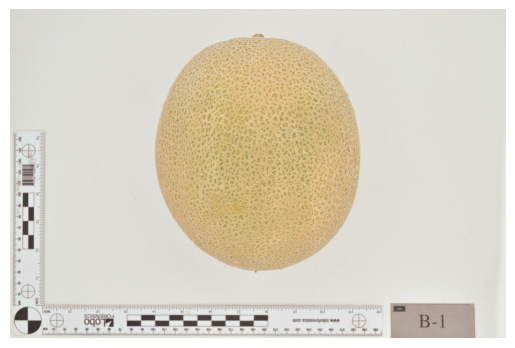

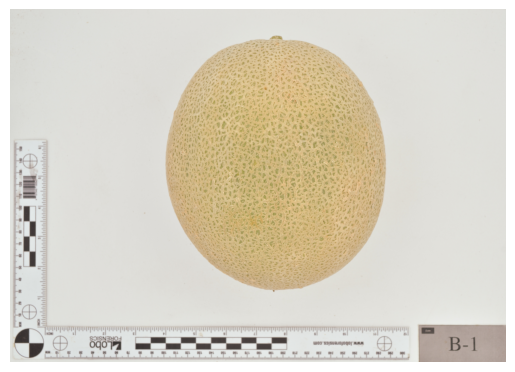

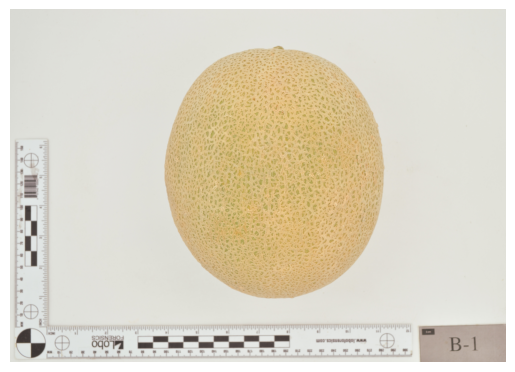

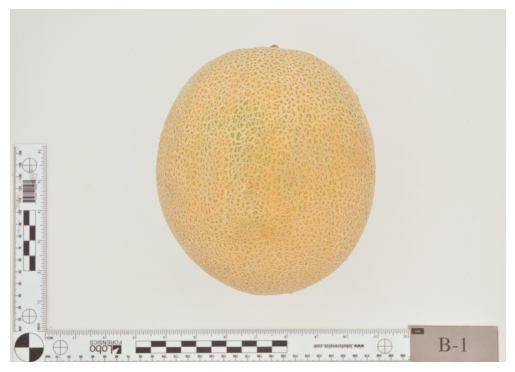

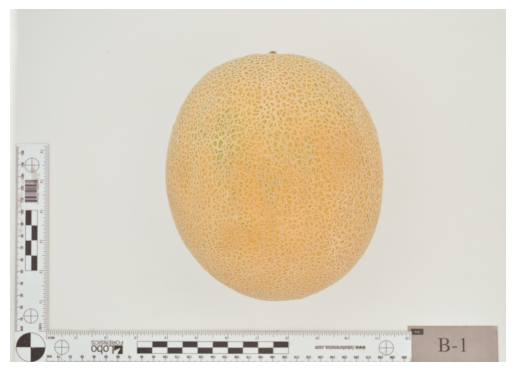

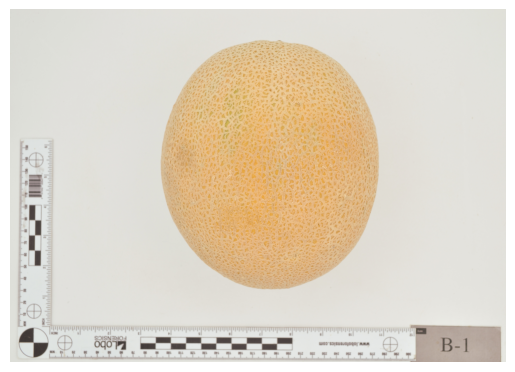

In [ ]:
from PIL import Image
for path in filtered_paths:
    image = Image.open(path)

    plt.imshow(image)
    plt.axis('off')
    plt.show()

In [16]:
def process_images(filepaths, crop_params, save_dir='', save = False):
    dfs = []
    for filepath in tqdm(filepaths):
        processor = MelonProcessor(filepath=filepath, 
                                   crop=False, crop_params=crop_params, save_dir=save_dir)
        df = processor.process(save=save, show_image=False, annotate=False, 
                               metadata=None, backend='plotly')
        dfs.append(df)
    return pd.concat(dfs)


In [19]:
process_images(filtered_paths, crop_params)

  0%|          | 0/6 [00:00<?, ?it/s]

,Row,Col,Red,Green,Blue,Tip,filename,filepath
1018,0,1018,207,195,171,None,B01_T1_arrived-day,../Trial-1-2023/All-melons-arrived-day/B01_T1_...
1019,0,1019,203,191,167,None,B01_T1_arrived-day,../Trial-1-2023/All-melons-arrived-day/B01_T1_...
1020,0,1020,203,191,167,None,B01_T1_arrived-day,../Trial-1-2023/All-melons-arrived-day/B01_T1_...
1021,0,1021,201,189,165,None,B01_T1_arrived-day,../Trial-1-2023/All-melons-arrived-day/B01_T1_...
1022,0,1022,199,187,163,None,B01_T1_arrived-day,../Trial-1-2023/All-melons-arrived-day/B01_T1_...
...,...,...,...,...,...,...,...,...
4653087,2303,1027,213,197,174,None,B01_T1_nd_8dsl_week1,../Trial-1-2023/Melon-B-8dsl-week1/B01_T1_nd_8...
4653088,2303,1028,214,198,175,None,B01_T1_nd_8dsl_week1,../Trial-1-2023/Melon-B-8dsl-week1/B01_T1_nd_8...
4653089,2303,1029,213,197,174,None,B01_T1_nd_8dsl_week1,../Trial-1-2023/Melon-B-8dsl-week1/B01_T1_nd_8...
4653090,2303,1030,215,199,176,None,B01_T1_nd_8dsl_week1,../Trial-1-2023/Melon-B-8dsl-week1/B01_T1_nd_8...


In [25]:
# standard melons for color analysis
filepaths = ["/Users/bw/Documents/Melon/Trial-1-2023/Melon-A-0dsl-week1/A01_T1_nd_0dsl_week1.jpg",
             "/Users/bw/Documents/Melon/Trial-1-2023/Melon-B-2dsl-week2/B25_T1_nd_2dsl_week2.jpg",
             "/Users/bw/Documents/Melon/Trial-1-2023/Melon-C-4dsl-week3/C49_T1_nd_4dsl_week3.jpg",
             "/Users/bw/Documents/Melon/Trial-1-2023/Melon-C-6dsl-week1/C01_T1_nd_6dsl_week1.jpg",
             "/Users/bw/Documents/Melon/Trial-1-2023/Melon-B-6dsl-week3/B49_T1_nd_6dsl_week3.jpg",
             "/Users/bw/Documents/Melon/Trial-1-2023/Melon-A-8dsl-week2/A25_T1_nd_8dsl_week2.jpg"
             ]

dfs = process_images(filepaths, crop_params)
dfs.to_csv(os.path.join(LOCAL_FOLDER, "combined_pixel_data.csv"), index=False)

  0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

csv_file = "../B01/combined_pixel_data.csv" 
df = pd.read_csv(csv_file)


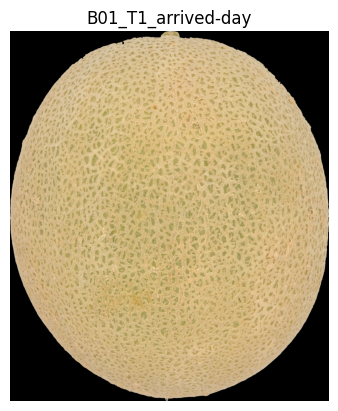

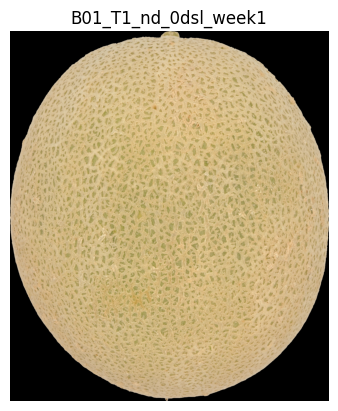

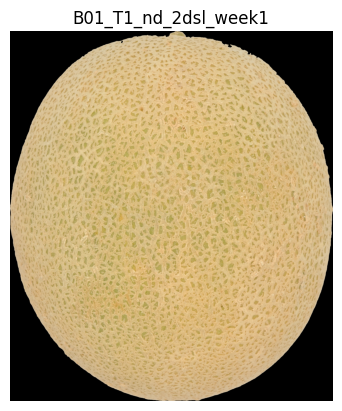

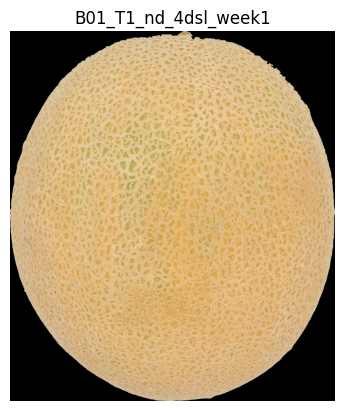

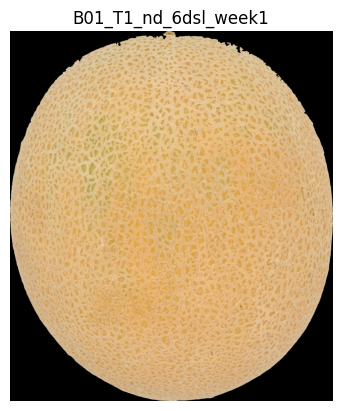

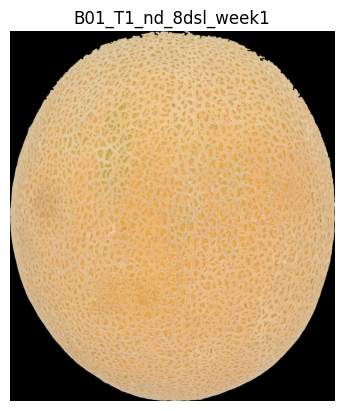

In [ ]:
def plot_image(df, filename):
    # Find maximum row and column values
    max_row = df["Row"].max() + 1
    max_col = df["Col"].max() + 1

    image = np.zeros((max_row, max_col, 3), dtype=np.uint8)

    for _, row in df.iterrows():
        r, c = row["Row"], row["Col"]
        image[r, c] = [row["Red"], row["Green"], row["Blue"]]

    plt.imshow(image)
    plt.axis("off") 
    plt.title(filename)
    plt.show()
    
for filename in df["filename"].unique():
    plot_image(df[df["filename"] == filename], filename)

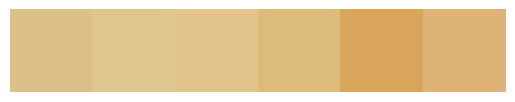

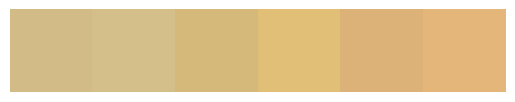

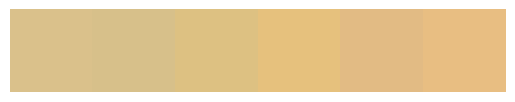

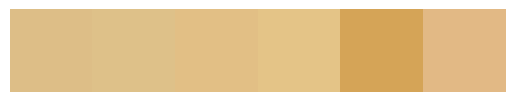

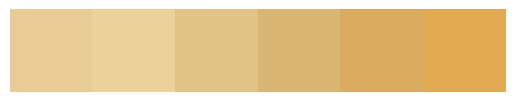

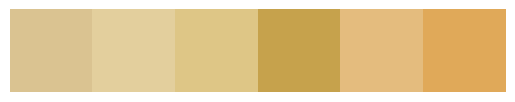

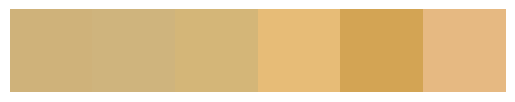

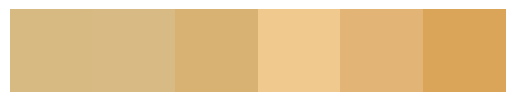

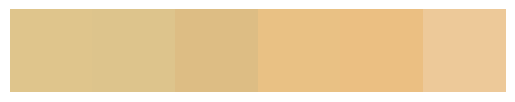

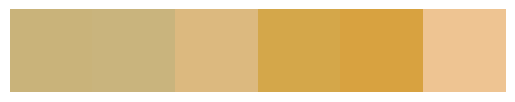

In [2]:
for tmp in range(10):
    one_pixel = df[(df["Col"]==1000+tmp*10) & (df["Row"]==1000+tmp*10)]
    colors = one_pixel[["Red", "Green", "Blue"]].values
    color_array = np.array([colors]) / 255

    plt.imshow(color_array)
    plt.axis('off')
    plt.show()

In [3]:
df["filename"].unique()

array(['B01_T1_arrived-day', 'B01_T1_nd_0dsl_week1',
       'B01_T1_nd_2dsl_week1', 'B01_T1_nd_4dsl_week1',
       'B01_T1_nd_6dsl_week1', 'B01_T1_nd_8dsl_week1'], dtype=object)

## 1st modification of data structure

In [4]:
import re
# Create the "cold" column:
# Set to 0 if the filename contains "arrived-day", and 1 if it contains "week1".
df["cold"] = df["filename"].apply(
    lambda x: 0 if "arrived-day" in x else (1 if "week1" in x else np.nan)
)

# Define a function to create the "shelf" column:
# If the filename contains "arrived-day", return 0.
# Otherwise, extract the number between "nd_" and "dsl" from the filename.
def extract_shelf(filename):
    if "arrived-day" in filename:
        return 0
    # Use regex to find the digits between "nd_" and "dsl", e.g., in "nd_2dsl".
    match = re.search(r'nd_(\d+)dsl', filename)
    if match:
        return int(match.group(1))
    else:
        return np.nan

# Apply the function to create the "shelf" column
df["shelf"] = df["filename"].apply(extract_shelf)

print(df)

           Row   Col  Red  Green  Blue  Tip              filename  \
0            0  1018  207    195   171  NaN    B01_T1_arrived-day   
1            0  1019  203    191   167  NaN    B01_T1_arrived-day   
2            0  1020  203    191   167  NaN    B01_T1_arrived-day   
3            0  1021  201    189   165  NaN    B01_T1_arrived-day   
4            0  1022  199    187   163  NaN    B01_T1_arrived-day   
...        ...   ...  ...    ...   ...  ...                   ...   
22395994  2303  1027  213    197   174  NaN  B01_T1_nd_8dsl_week1   
22395995  2303  1028  214    198   175  NaN  B01_T1_nd_8dsl_week1   
22395996  2303  1029  213    197   174  NaN  B01_T1_nd_8dsl_week1   
22395997  2303  1030  215    199   176  NaN  B01_T1_nd_8dsl_week1   
22395998  2303  1031  214    199   176  NaN  B01_T1_nd_8dsl_week1   

                                                   filepath  cold  shelf  
0         ../Trial-1-2023/All-melons-arrived-day/B01_T1_...     0      0  
1         ../Trial-1-

In [ ]:
# Example: assume df is already your DataFrame with columns like:
# "Row", "Col", "Red", "filename", "shelf", etc.
# (Here, df is assumed to be defined already.)

# Pivot the DataFrame so that:
# - The index is the unique combination of ["Row", "Col"]
# - The columns are the unique shelf values
# - The values are the "Red" values (aggregated by mean if multiple entries exist)
df_pivot = df.pivot_table(index=["Row", "Col"], 
                          columns="shelf", 
                          values="Blue", 
                          aggfunc="mean")

# The pivoted DataFrame has shelf numbers as column names (e.g., 0, 2, 4, 6, 8).
# Rename these columns by prefixing "D" to each shelf number.
df_pivot.columns = ["D" + str(int(col)) for col in df_pivot.columns]

# Reset the index so that "Row" and "Col" become normal columns.
df_pivot.reset_index(inplace=True)

# Optionally, reorder the columns to ensure the final order is:
# Row, Col, D0, D2, D4, D6, D8.
# This will also add any missing columns (if a shelf is missing) with NaN.
desired_columns = ["Row", "Col", "D0", "D2", "D4", "D6", "D8"]
df_pivot = df_pivot.reindex(columns=desired_columns)

print(df_pivot)

          Row   Col     D0  D2  D4     D6  D8
0           0   989    NaN NaN NaN  180.0 NaN
1           0   990    NaN NaN NaN  178.0 NaN
2           0   991    NaN NaN NaN  178.0 NaN
3           0   992    NaN NaN NaN  179.0 NaN
4           0   993    NaN NaN NaN  177.0 NaN
...       ...   ...    ...  ..  ..    ...  ..
3831412  2370  1003  163.0 NaN NaN    NaN NaN
3831413  2370  1004  158.0 NaN NaN    NaN NaN
3831414  2370  1005  159.0 NaN NaN    NaN NaN
3831415  2370  1006  161.0 NaN NaN    NaN NaN
3831416  2370  1007  178.0 NaN NaN    NaN NaN

[3831417 rows x 7 columns]


In [ ]:
# count the number of not NaN values in each row
df_pivot[["D0", "D2", "D4", "D6", "D8"]].count(axis=0)

D0    3782545
D2    3752994
D4    3711030
D6    3687632
D8    3683619
dtype: int64

In [30]:
#data summary
df_pivot[["Row", "Col"]].describe()

,Row,Col
count,3.831417e+06,3.831417e+06
mean,1.170516e+03,1.026862e+03
std,5.927153e+02,5.147224e+02
min,0.000000e+00,0.000000e+00
25%,6.880000e+02,6.090000e+02
50%,1.170000e+03,1.028000e+03
75%,1.651000e+03,1.446000e+03
max,2.370000e+03,2.040000e+03


In [6]:
# Define the required columns that must have non-null values
required_columns = ["D0", "D2", "D4", "D6", "D8"]

# Filter the DataFrame to include only rows where all the required columns are non-null
df_pivot_filtered = df_pivot.dropna(subset=required_columns)

print(df_pivot_filtered)

          Row   Col     D0     D2     D4     D6     D8
5319       22  1007   91.0  170.0  164.0   82.0  141.0
5320       22  1008   92.5  162.0  161.0   85.0  133.0
5321       22  1009   92.5  158.0  162.0   88.0  125.0
5322       22  1010   93.5  153.0  166.0   84.0  115.0
5323       22  1011   93.5  152.0  167.0   87.0  110.0
...       ...   ...    ...    ...    ...    ...    ...
3810615  2303  1027  136.0  113.0  144.0  142.0  174.0
3810616  2303  1028  135.5  113.0  145.0  140.0  175.0
3810617  2303  1029  135.5  111.0  146.0  141.0  174.0
3810618  2303  1030  138.5  109.0  148.0  142.0  176.0
3810619  2303  1031  140.5  105.0  150.0  141.0  176.0

[3627072 rows x 7 columns]


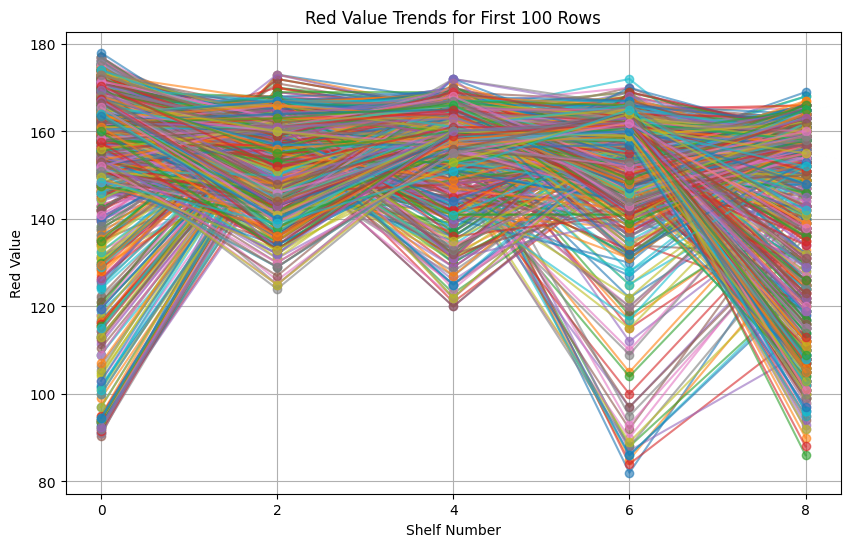

In [7]:
import matplotlib.pyplot as plt

# Define the shelf numbers corresponding to the columns D0, D2, D4, D6, D8.
shelf_numbers = [0, 2, 4, 6, 8]

# Select the first 100 rows from df_pivot_filtered.
# Note: This uses zero-based indexing, so it takes rows with indices 0 through 99.
subset = df_pivot_filtered.iloc[:1000]

plt.figure(figsize=(10, 6))

# Loop over each row in the subset and plot its Red values.
for idx, row in subset.iterrows():
    # Extract the Red values corresponding to each shelf.
    red_values = [row['D0'], row['D2'], row['D4'], row['D6'], row['D8']]
    plt.plot(shelf_numbers, red_values, marker='o', linestyle='-', alpha=0.6)
    # Optionally, you could add a label for each row, but with 100 lines the legend may be too crowded.
    # Example (commented out):
    # plt.plot(shelf_numbers, red_values, marker='o', linestyle='-', alpha=0.6, 
    #          label=f"Row {row['Row']}, Col {row['Col']}")

plt.xlabel("Shelf Number")
plt.ylabel("Red Value")
plt.title("Red Value Trends for First 100 Rows")
plt.xticks(shelf_numbers)
plt.grid(True)
plt.show()

## 2nd modification of data structure

In [20]:
def process_images_cpt(filepaths, crop_params, save_dir=''):
    cols = np.zeros((216, 2500, 2500))
    for filepath in tqdm(filepaths):
        processor = MelonProcessor(filepath=filepath, 
                                   crop=False, crop_params=crop_params, save_dir=save_dir)
        df = processor.process(save=False, show_image=False, annotate=False, 
                               metadata=None, backend='plotly')
        dfs.append(df)
    return pd.concat(dfs)

In [14]:
import matplotlib.colors as mcolors

def find_nearest_cluster(df, cluster_list):
    # finding nearest cluster for each pixel of given dataframe

    # Create a 2D array of pixel colors
    pixel_colors = df[["Red", "Green", "Blue"]].values

    # Create a 2D array of cluster colors
    cluster_colors = np.array([mcolors.hex2color(color) for color in cluster_list]) * 255

    # Calculate the Euclidean distance between each pixel and each cluster
    distances = np.linalg.norm(pixel_colors[:, None] - cluster_colors, axis=2)

    # Find the nearest cluster for each pixel
    nearest_clusters = np.argmin(distances, axis=1)

    return nearest_clusters

In [15]:
LOCAL_FOLDER = "../Trial-1-2023"
file_ext = ['png', 'jpg']
filepaths = glob_filepath(LOCAL_FOLDER, ext=file_ext, subfolder=True)
print(filepaths)

['../Trial-1-2023/All-melons-arrived-day/A01_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A02_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A03_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A04_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A05_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A06_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A07_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A08_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A09_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A10_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A11_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A12_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A13_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A14_T1_arrived-day...jpg', '../Trial-1-2023/All-melons-arrived-day/A15_T1_arrived-day...

## TODO : need a sophisticated selection of standard for color clustering

In [16]:
color_cluster = np.load("./result/color_cluster.npy", allow_pickle=True)
# add "#000000" at the beginning of the color_cluster
color_cluster = ["#000000"] + color_cluster.tolist()
print(color_cluster)

['#000000', '#644e31', '#876739', '#a6874f', '#a87524', '#bf872f', '#ebbe7e', '#e3c79f', '#c8ac83', '#b89867', '#d39c40', '#d6aa62', '#edb353']


In [17]:
letters = ["A", "B", "C"]
numbers = [f"{i:02d}" for i in range(1, 73)]

MelonID_list = [f"{letter}{num}" for letter in letters for num in numbers]

MelonID = np.array(MelonID_list, dtype="U3")
MelonID

array(['A01', 'A02', 'A03', 'A04', 'A05', 'A06', 'A07', 'A08', 'A09',
       'A10', 'A11', 'A12', 'A13', 'A14', 'A15', 'A16', 'A17', 'A18',
       'A19', 'A20', 'A21', 'A22', 'A23', 'A24', 'A25', 'A26', 'A27',
       'A28', 'A29', 'A30', 'A31', 'A32', 'A33', 'A34', 'A35', 'A36',
       'A37', 'A38', 'A39', 'A40', 'A41', 'A42', 'A43', 'A44', 'A45',
       'A46', 'A47', 'A48', 'A49', 'A50', 'A51', 'A52', 'A53', 'A54',
       'A55', 'A56', 'A57', 'A58', 'A59', 'A60', 'A61', 'A62', 'A63',
       'A64', 'A65', 'A66', 'A67', 'A68', 'A69', 'A70', 'A71', 'A72',
       'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09',
       'B10', 'B11', 'B12', 'B13', 'B14', 'B15', 'B16', 'B17', 'B18',
       'B19', 'B20', 'B21', 'B22', 'B23', 'B24', 'B25', 'B26', 'B27',
       'B28', 'B29', 'B30', 'B31', 'B32', 'B33', 'B34', 'B35', 'B36',
       'B37', 'B38', 'B39', 'B40', 'B41', 'B42', 'B43', 'B44', 'B45',
       'B46', 'B47', 'B48', 'B49', 'B50', 'B51', 'B52', 'B53', 'B54',
       'B55', 'B56',

In [18]:
import h5py

def process_images_color_clusters(filepaths, crop_params, save_dir='', save = False):
    cols = np.zeros((216, 3000, 3000))
    for filepath in tqdm(filepaths):
        # Melon ID : A01, A02, ...
        MID = np.where(MelonID == filepath.split("/")[-1].split("_")[0])[0][0]

        processor = MelonProcessor(filepath=filepath, 
                                   crop=False, crop_params=crop_params, save_dir=save_dir)
        df = processor.process(save=save, show_image=False, annotate=False, 
                               metadata=None, backend='plotly')
        clust = find_nearest_cluster(df, color_cluster)

        weight = 0
        if filepath.split("/")[-1].split("_")[2]=='arrived-day...jpg': # arrived-day
            weight = 1
        else:
            weight = 13**(int(filepath.split("/")[-1].split("_")[3][0])/2 + 1)
            # 0 day -> 13, 2 day -> 13**2, 4 day -> 13**3, 6 day -> 13**4, 8 day -> 13**5

        row_indices = df["Row"].to_numpy()
        col_indices = df["Col"].to_numpy()
        cols[MID, row_indices, col_indices] += (clust * weight)

    return cols


In [53]:
cols = process_images_color_clusters(filepaths, crop_params)

with h5py.File("cols.h5", "w") as f:
    f.create_dataset("dataset", data=cols)

  0%|          | 0/1170 [00:00<?, ?it/s]

In [19]:
with h5py.File("cols.h5", "r") as f:
    cols = f["dataset"][:]
cols.shape

(216, 3000, 3000)

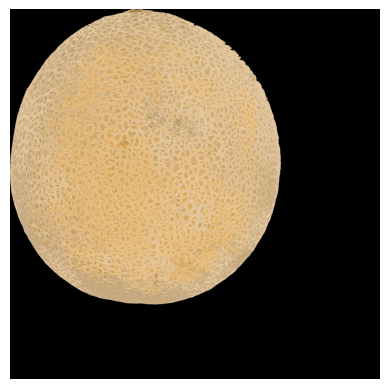

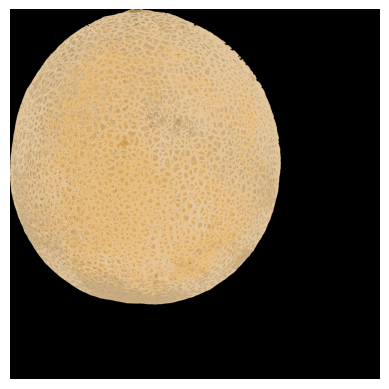

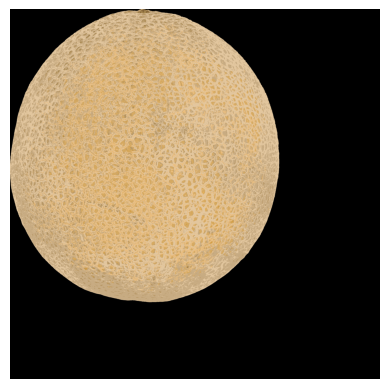

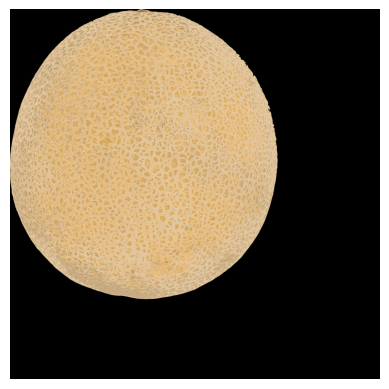

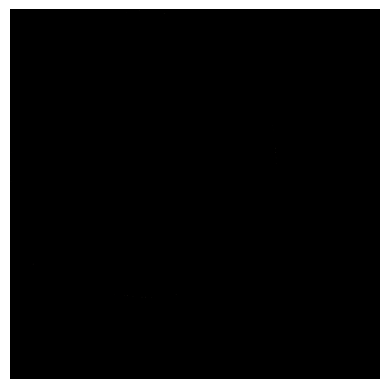

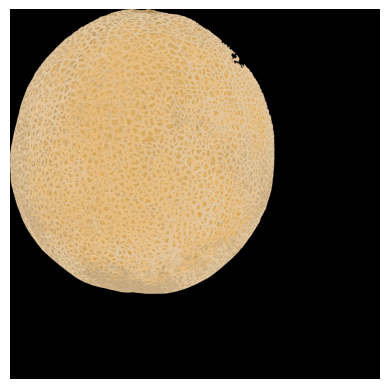

In [ ]:
# To see saving and loading the data works
idx = 16
for j in range(6):
    pow = 13**j
    indices = ((cols[idx,:,:]/pow) % 13).astype(int)  

    result = np.take(color_cluster, indices)  

    def hex_to_rgb_array(hex_array):
        """HEX 색상 배열을 RGB로 변환"""
        rgb_array = np.array([[mcolors.hex2color(color) for color in row] for row in hex_array])
        return rgb_array

    rgb_result = hex_to_rgb_array(result)

    plt.imshow(rgb_result) 
    plt.axis('off')
    plt.show()

# Analysis 1. Clustering Melons based on their color clusters

## 1-1. 60 dimension vector, Euclidean Distance

In [58]:
pts = np.zeros((216, 60))

for i in tqdm(range(cols.shape[0])):
    for j in range(1, 6): # only day 0, 2, 4, 6, 8 (not arrived-day)
        digits = 13**j
        tmp = (np.floor(cols[i,:,:]/digits) % 13).flatten()
        v = pd.Series(tmp[tmp != 0]).value_counts(normalize=True)
        for k in range(v.size): # v.index : from 1 to 12
            pts[i, (j - 1) * 12 + (v.index[k] - 1).astype(int)] = v.values[k]

# save pts to .npy
np.save('./result/pts.npy', pts)

  0%|          | 0/216 [00:00<?, ?it/s]

In [59]:
ptsA = np.zeros((216, 12))

for i in tqdm(range(cols.shape[0])):
    # only arrived-day
    tmp = (np.floor(cols[i,:,:]) % 13).flatten()
    v = pd.Series(tmp[tmp != 0]).value_counts(normalize=True)
    for k in range(v.size): # v.index : from 1 to 12
        ptsA[i, (v.index[k] - 1).astype(int)] = v.values[k]

np.save('./result/ptsA.npy', ptsA)

  0%|          | 0/216 [00:00<?, ?it/s]

In [20]:
pts = np.load("./result/pts.npy", allow_pickle=True)
ptsA = np.load("./result/ptsA.npy", allow_pickle=True)

In [50]:
pts[72, :]

array([  4.49550397e-06,   2.11024245e-04,   3.16652722e-02,
         2.61796996e-05,   2.61796996e-05,   1.01429147e-01,
         2.74672384e-01,   4.33340138e-01,   1.46539678e-01,
         1.31956264e-04,   1.19535450e-02,   0.00000000e+00,
         2.93099323e-06,   8.26007183e-06,   1.03170962e-02,
         3.59712805e-05,   1.65201437e-04,   3.23626150e-01,
         2.34099229e-01,   2.25144245e-01,   1.05132595e-01,
         5.89156284e-03,   9.55751595e-02,   1.59872358e-06,
         5.38933935e-07,   8.89240992e-06,   1.71354045e-03,
         2.64077628e-05,   3.16084753e-04,   4.23556802e-01,
         2.20834647e-01,   1.11179376e-01,   2.69184027e-02,
         3.72327898e-02,   1.77400075e-01,   8.12442907e-04,
         5.42353467e-07,   8.67765547e-06,   9.01391462e-04,
         3.19988545e-05,   2.21551391e-04,   4.50723391e-01,
         1.72443997e-01,   1.15526441e-01,   1.81487741e-02,
         4.98683166e-02,   1.86349668e-01,   5.77525089e-03,
         1.35736079e-06,

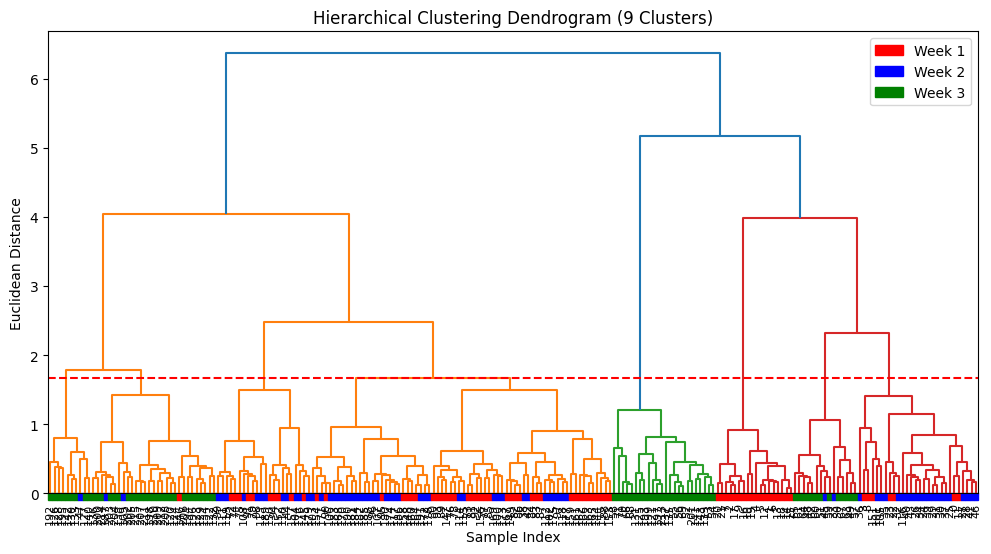

Cluster Labels (Total 9 Clusters):
[[ 0  1  9  0  0  0  0  0  0]
 [ 1  2 26  0  0  0  0  0  0]
 [10 12  0  0  0  0  0  0  0]
 [ 7 21  0  0  0  0  0  0  0]
 [29 13  0  0  0  0  0  0  0]
 [ 0  0 24  0  0  0  0  0  0]
 [18  0  0  0  0  0  0  0  0]
 [ 0  2 13  0  0  0  0  0  0]
 [ 7 21  0  0  0  0  0  0  0]]
{0: 2, 1: 2, 2: 1, 3: 1, 4: 0, 5: 2, 6: 0, 7: 2, 8: 1}
[2 1 1 2 1 1 1 1 2 1 1 2 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 3 2 2 2
 2 1 2 2 2 1 2 2 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 1
 2 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 2 2 1 1 2 2 2 1 2 2 1 2 1 2 2 2 2 2 2 3 2
 2 1 2 1 1 2 2 1 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 2 3 1
 2 1 2 2 2 1 2 1 1 2 2 1 2 1 1 1 2 1 1 1 2 1 2 2 2 1 2 1 2 1 2 2 2 2 2 2 2
 2 2 3 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]


array([[47, 13,  0],
       [24, 54,  0],
       [ 1,  5, 72]])

In [ ]:
import numpy as np
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import fcluster
from scipy.optimize import linear_sum_assignment
from sklearn.metrics import confusion_matrix
import matplotlib.patches as patches

distance_matrix = sch.distance.pdist(pts, metric='euclidean')

linkage_matrix = sch.linkage(distance_matrix, method='ward')

num_clusters = 9
cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

answers = np.tile(np.repeat([1, 2, 3], 24), 3)

color_map = {1: "red", 2: "blue", 3: "green"}

fig, ax = plt.subplots(figsize=(12, 6))
dendrogram_data = sch.dendrogram(linkage_matrix, leaf_rotation=90, leaf_font_size=8, ax=ax)

leaf_labels = np.array(dendrogram_data['leaves'])

xticks_positions = [tick.get_position()[0] for tick in ax.get_xticklabels()]

for x, sample_index in zip(xticks_positions, leaf_labels):
    rect = patches.Rectangle((x - 5, -0.1), 10, 0.1, color=color_map[answers[sample_index]], transform=ax.transData, clip_on=False)
    ax.add_patch(rect)

ax.set_xticklabels(leaf_labels, fontsize=8, rotation=90)
plt.axhline(y=linkage_matrix[-(num_clusters - 1), 2], color='r', linestyle='--') 

# legend with color_map
handles = [patches.Patch(color=color, label=f"Week {cluster}") for cluster, color in color_map.items()]
plt.legend(handles=handles, loc='upper right')
plt.title(f"Hierarchical Clustering Dendrogram ({num_clusters} Clusters)")
plt.xlabel("Sample Index")
plt.ylabel("Euclidean Distance")
plt.show()

print(f"Cluster Labels (Total {num_clusters} Clusters):")
# as.numpy cluster_labels
cluster_labels = np.array(cluster_labels)
#print(cluster_labels)

#print(answers)

# cluster_labels and answers confusion matrix
print(confusion_matrix(cluster_labels, answers))

def match_clusters(true_labels, pred_labels):

    cm = confusion_matrix(true_labels, pred_labels)

    cluster_mapping = {}
    for pred_cluster in range(cm.shape[1]):  
        best_true_cluster = np.argmax(cm[:, pred_cluster]) 
        cluster_mapping[pred_cluster] = best_true_cluster 

    matched_pred_labels = np.array([cluster_mapping[label] for label in pred_labels])

    return matched_pred_labels, cluster_mapping

matched_pred_labels, cluster_mapping = match_clusters(answers-1, cluster_labels-1)
print(cluster_mapping)
print(matched_pred_labels+1)
confusion_matrix(matched_pred_labels+1, answers)

n =  1 Corrected : ( 72.0 / 216 )
 [[72 72 72]
 [ 0  0  0]
 [ 0  0  0]]
n =  2 Corrected : ( 86.0 / 216 )
 [[ 0  0  0]
 [47 49 35]
 [25 23 37]]
n =  3 Corrected : ( 98.0 / 216 )
 [[25 23 13]
 [47 49 35]
 [ 0  0 24]]
n =  4 Corrected : ( 130.0 / 216 )
 [[71 69 13]
 [ 0  0  0]
 [ 1  3 59]]
n =  5 Corrected : ( 146.0 / 216 )
 [[64 46  0]
 [ 7 23 13]
 [ 1  3 59]]
n =  6 Corrected : ( 148.0 / 216 )
 [[54 34  0]
 [17 35 13]
 [ 1  3 59]]
n =  7 Corrected : ( 159.0 / 216 )
 [[54 34  0]
 [17 33  0]
 [ 1  5 72]]
n =  8 Corrected : ( 159.0 / 216 )
 [[54 34  0]
 [17 33  0]
 [ 1  5 72]]
n =  9 Corrected : ( 173.0 / 216 )
 [[47 13  0]
 [24 54  0]
 [ 1  5 72]]
n =  10 Corrected : ( 173.0 / 216 )
 [[52 18  0]
 [19 49  0]
 [ 1  5 72]]
n =  11 Corrected : ( 173.0 / 216 )
 [[52 18  0]
 [19 49  0]
 [ 1  5 72]]
n =  12 Corrected : ( 173.0 / 216 )
 [[52 18  0]
 [19 49  0]
 [ 1  5 72]]
n =  13 Corrected : ( 173.0 / 216 )
 [[55 21  0]
 [16 46  0]
 [ 1  5 72]]
n =  14 Corrected : ( 173.0 / 216 )
 [[55 21  0]
 

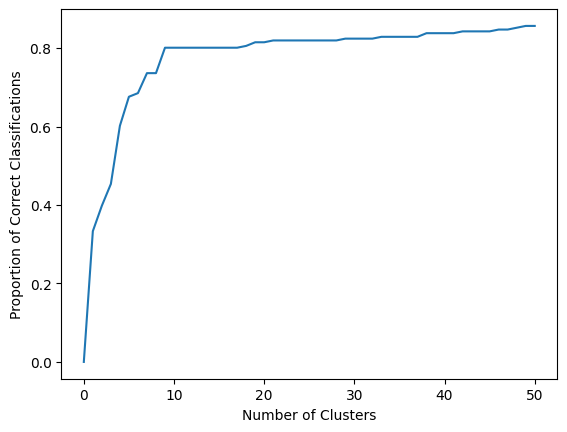

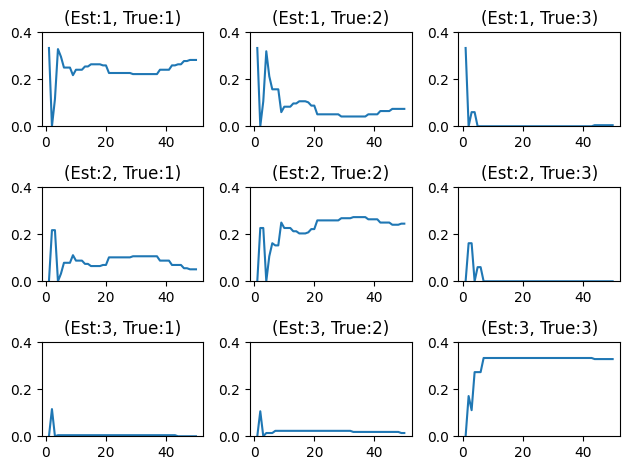

In [38]:
def get_confusion_matrix(linkage_matrix, num_clusters):
    cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
    matched_pred_labels, cluster_mapping = match_clusters(answers-1, cluster_labels-1)
    return confusion_matrix(matched_pred_labels+1, answers)

M = 51
corrected = np.zeros(M)
mats = np.zeros((M, 3, 3))

for n in range(1, M):
    mat = get_confusion_matrix(linkage_matrix, n)
    corrected[n] = np.trace(mat)
    mats[n,:,:] = mat
    print("n = ", n, "Corrected : (", corrected[n], "/", np.sum(mat), ")\n", mat)

plt.plot(corrected / 216)
plt.xlabel("Number of Clusters")
plt.ylabel("Proportion of Correct Classifications")
plt.show()

fig, axes = plt.subplots(3, 3)
for i in range(3):
    for j in range(3):
        axes[i, j].plot(range(1, M), mats[range(1, M), i, j] / 216)
        axes[i, j].set_title(f"(Est:{i+1}, True:{j+1})")
        axes[i, j].set_ylim(0, 0.4)
plt.tight_layout()
plt.show()


### Find Est < True

In [42]:
num_clusters = 4
cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
matched_pred_labels, cluster_mapping = match_clusters(answers-1, cluster_labels-1)

#print(matched_pred_labels+1)
#print(answers)

wrongs_idx = np.where(matched_pred_labels + 1 - answers < -1)[0]
MelonID[wrongs_idx] # wrongs

array(['A49', 'A50', 'A51', 'A52', 'A58', 'A60', 'A61', 'A62', 'A63',
       'A64', 'A65', 'A66', 'A68'],
      dtype='<U3')

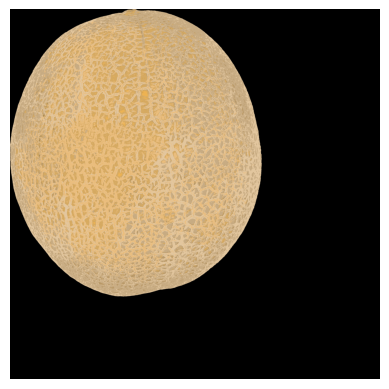

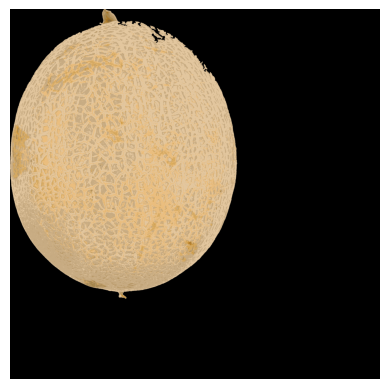

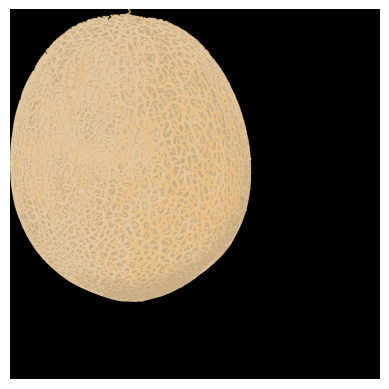

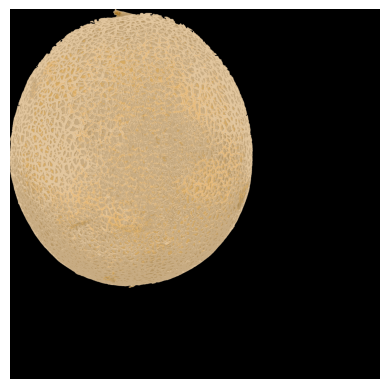

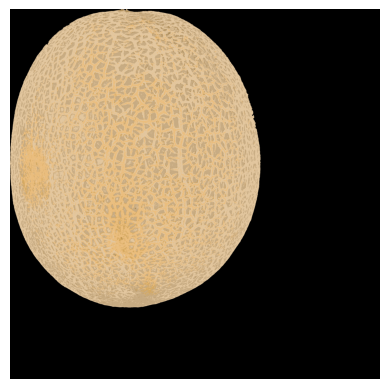

...

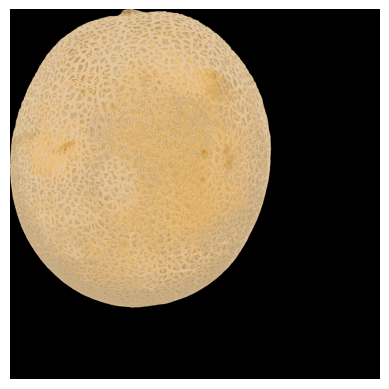

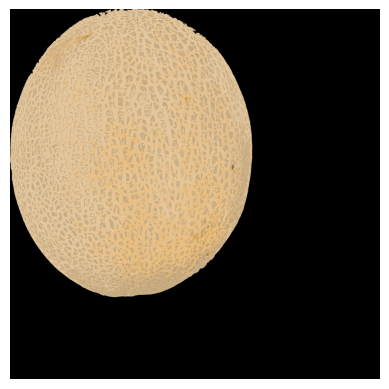

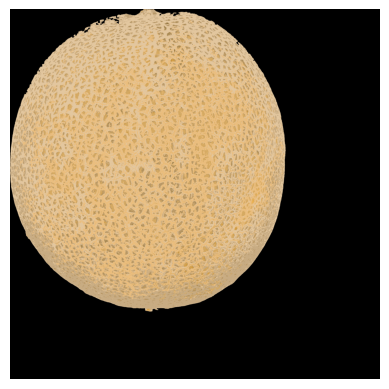

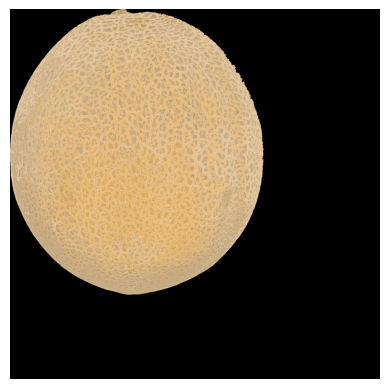

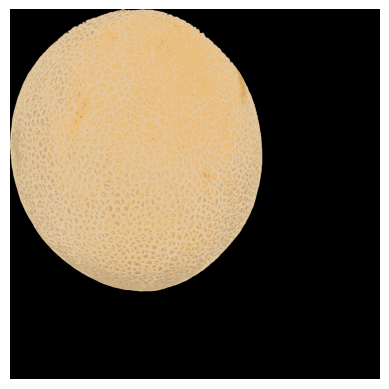

In [ ]:
for i in wrongs_idx:
    indices = (cols[i,:,:] % 13).astype(int)  

    result = np.take(color_cluster, indices) 

    rgb_result = hex_to_rgb_array(result)

    plt.imshow(rgb_result) 
    plt.axis('off')
    plt.show()

## 1-1-1. Graphs

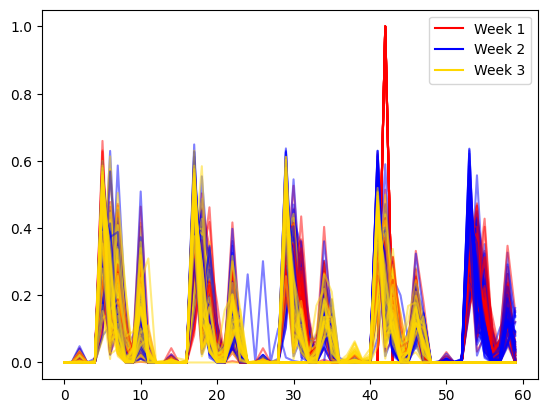

In [22]:
# graph of (x,pts[i,x]) colored by answers[i]
color_map = {1: "red", 2: "blue", 3: "gold"}
for i in range(216):
    plt.plot(range(60), pts[i, :], color = color_map[answers[i]], alpha = 0.5)
for i in range(3):
    plt.plot([], [], color = color_map[i+1], label = f"Week {i+1}")
plt.legend()
plt.show()

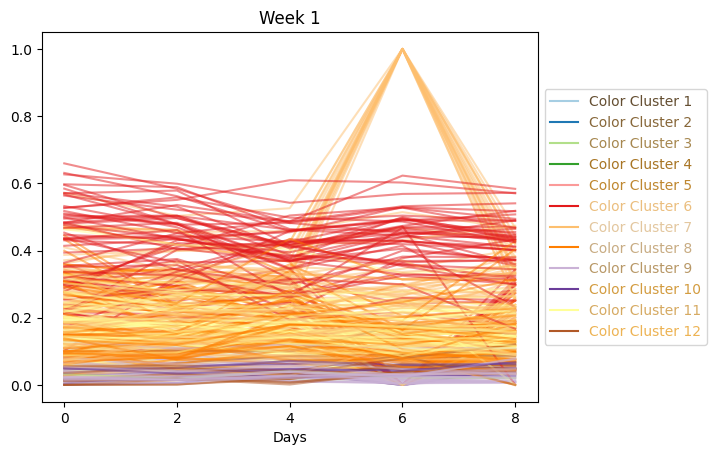

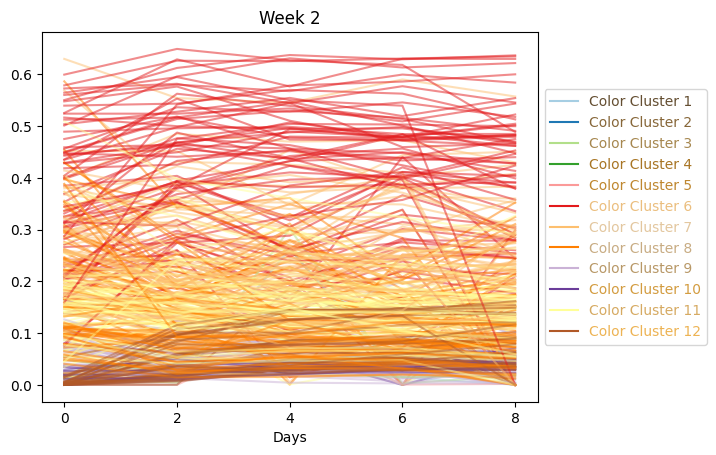

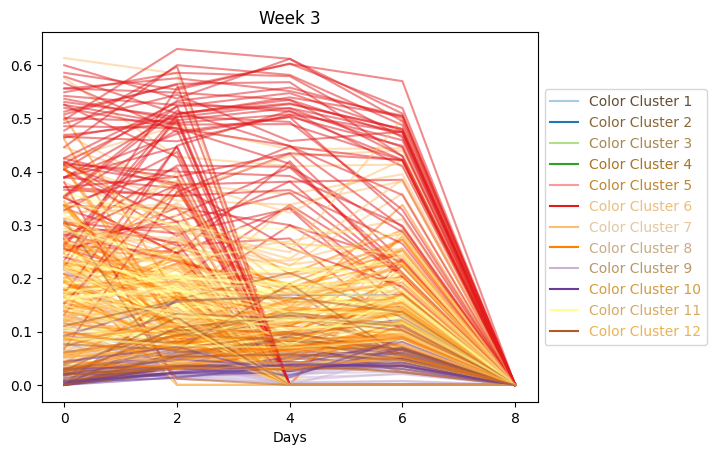

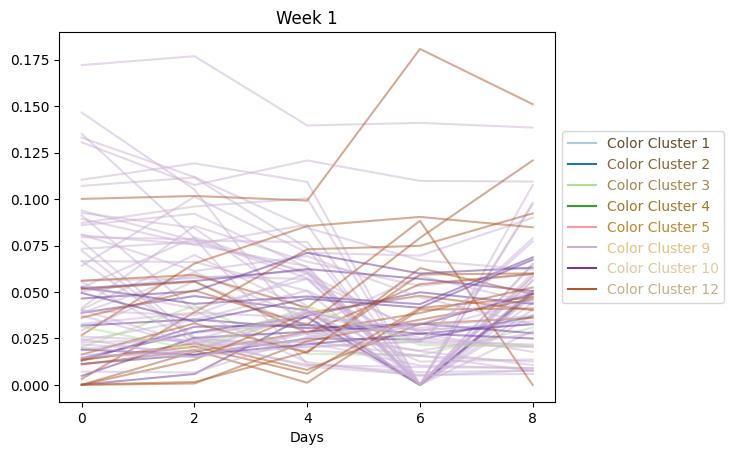

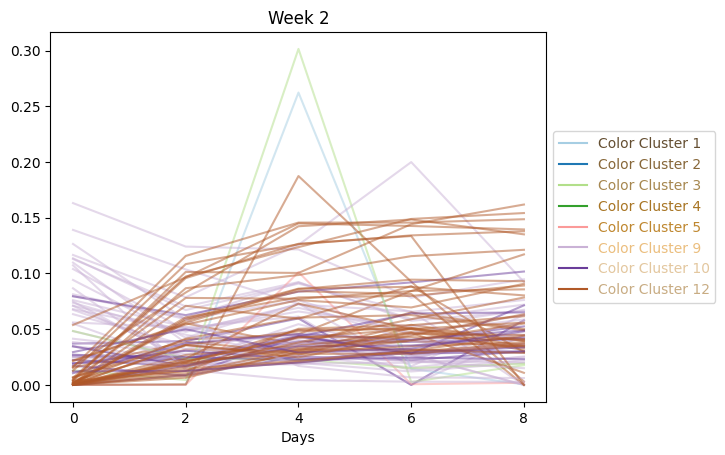

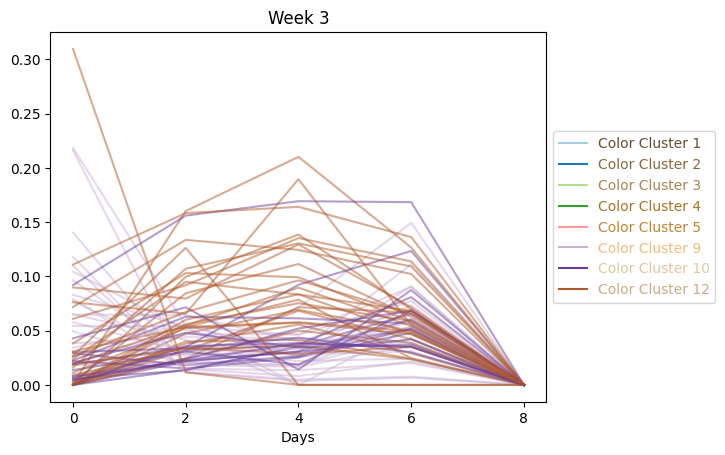

In [23]:
import seaborn as sns
color_pal = sns.color_palette("Paired", 12)

def plot_cluster_color(weekNo, colors = range(12)):
    for i in range(216):
        if answers[i] == weekNo:
            for j in colors:
                if sum(pts[i, range(j, 60, 12)])<0.1:
                    continue
                plt.plot(range(0, 10, 2), pts[i, range(j, 60, 12)], color = color_pal[j], alpha = 0.5)
    for i in colors:
        plt.plot([], [], color = color_pal[i], label = f"Color Cluster {i+1}")
    legend = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    for text, color in zip(legend.get_texts(), color_cluster[1:13]):
        text.set_color(color)
    plt.xticks(range(0, 10, 2))
    plt.xlabel("Days")
    plt.title(f"Week {weekNo}")
    plt.show()

plot_cluster_color(1)
plot_cluster_color(2)
plot_cluster_color(3)
plot_cluster_color(1, colors=[0, 1, 2, 3, 4, 8, 9, 11])
plot_cluster_color(2, colors=[0, 1, 2, 3, 4, 8, 9, 11])
plot_cluster_color(3, colors=[0, 1, 2, 3, 4, 8, 9, 11])

## 1-2. JS Distance

<Figure size 1000x500 with 0 Axes>

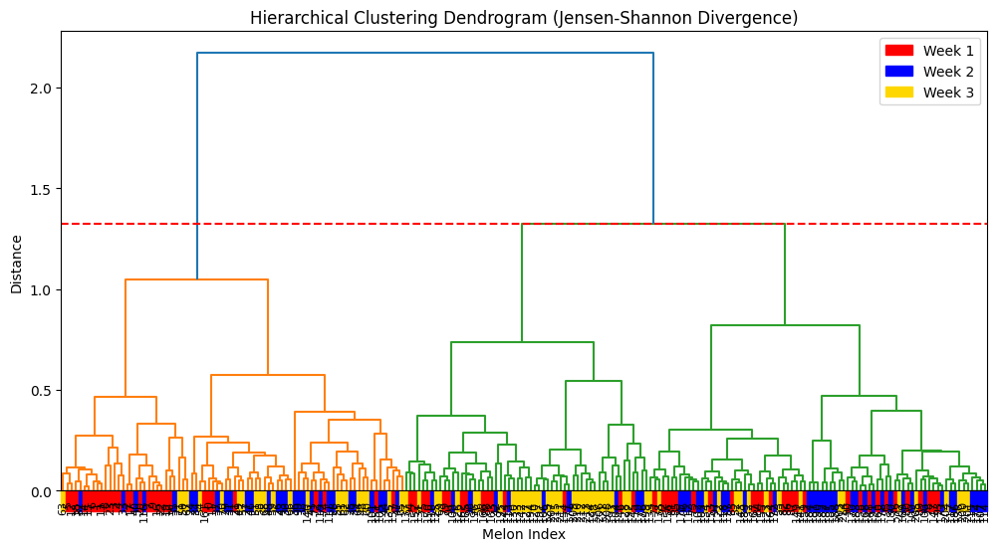

{0: 0, 1: 2, 2: 1}
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 2 2 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 2
 1 3 2 2 2 3 2 2 2 2 2 2 2 2 3 2 2 3 2 2 3 2 2 2 3 1 2 1 2 2 3 1 3 2 3 2 3
 1 2 3 2 2 1 2 2 1 3 3 2 2 3 3 3 3 3 3 3 3 2 3 2 1 2 3 2 2 1 2 3 2 3 3 3 2
 2 2 3 1 3 2 3 2 2 1 2 2 2 1 3 3 2 3 3 2 2 2 2 3 2 2 2 2 3 2 2 3 2 2 2 2 2
 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 2 2 2 2 2 2 3 3 3 3 3 3 3 3 2 3]


array([[29, 29, 22],
       [28, 33, 18],
       [15, 10, 32]])

In [ ]:
import numpy as np
import scipy.cluster.hierarchy as sch
import scipy.spatial.distance as dist
import matplotlib.pyplot as plt

pts2 = pts.reshape(216, 5, 12)

mean_vectors = np.mean(pts2, axis=1) 

distance_matrix = dist.pdist(mean_vectors, metric='jensenshannon')

linkage_matrix = sch.linkage(distance_matrix, method='ward')

num_clusters = 3
cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

plt.figure(figsize=(10, 5))

fig, ax = plt.subplots(figsize=(12, 6))
dendrogram_data = sch.dendrogram(linkage_matrix, leaf_rotation=90, leaf_font_size=8, ax=ax)

leaf_labels = np.array(dendrogram_data['leaves'])

xticks_positions = [tick.get_position()[0] for tick in ax.get_xticklabels()]

for x, sample_index in zip(xticks_positions, leaf_labels):
    rect = patches.Rectangle((x - 5, -0.1), 10, 0.1, color=color_map[answers[sample_index]], transform=ax.transData, clip_on=False)
    ax.add_patch(rect)

ax.set_xticklabels(leaf_labels, fontsize=8, rotation=90)
plt.axhline(y=linkage_matrix[-(num_clusters - 1), 2], color='r', linestyle='--')  

handles = [patches.Patch(color=color, label=f"Week {cluster}") for cluster, color in color_map.items()]
plt.legend(handles=handles, loc='upper right')
plt.title("Hierarchical Clustering Dendrogram (Jensen-Shannon Divergence)")
plt.xlabel("Melon Index")
plt.ylabel("Distance")
plt.show()


matched_pred_labels, cluster_mapping = match_clusters(answers-1, cluster_labels-1)
print(cluster_mapping)
print(matched_pred_labels+1)
confusion_matrix(matched_pred_labels+1, answers)

In [133]:

ax.get_ylim()[1]/4

0.30344880579137479

## 1-3. Color Importance Check

<Figure size 1000x500 with 0 Axes>

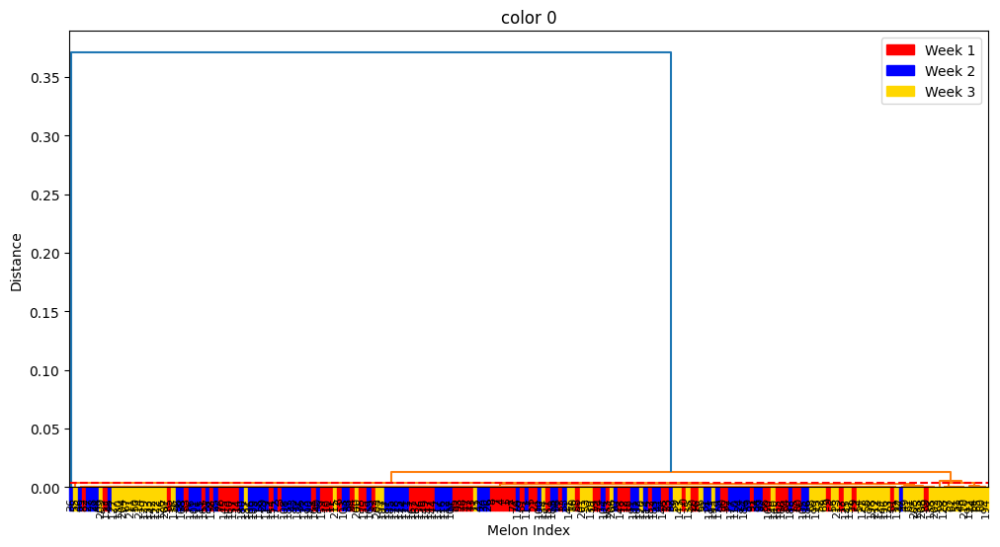

{0: 0, 1: 2, 2: 2, 3: 2, 4: 1}
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2
 1 1 1 1 1 1 1 1 1 1 1 3 1 1 3 1 1 1 1 1 3 1 1 3 1 3 3 3 3 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 3 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1]
[[72 71 60]
 [ 0  1  0]
 [ 0  0 12]]
0.393518518519


<Figure size 1000x500 with 0 Axes>

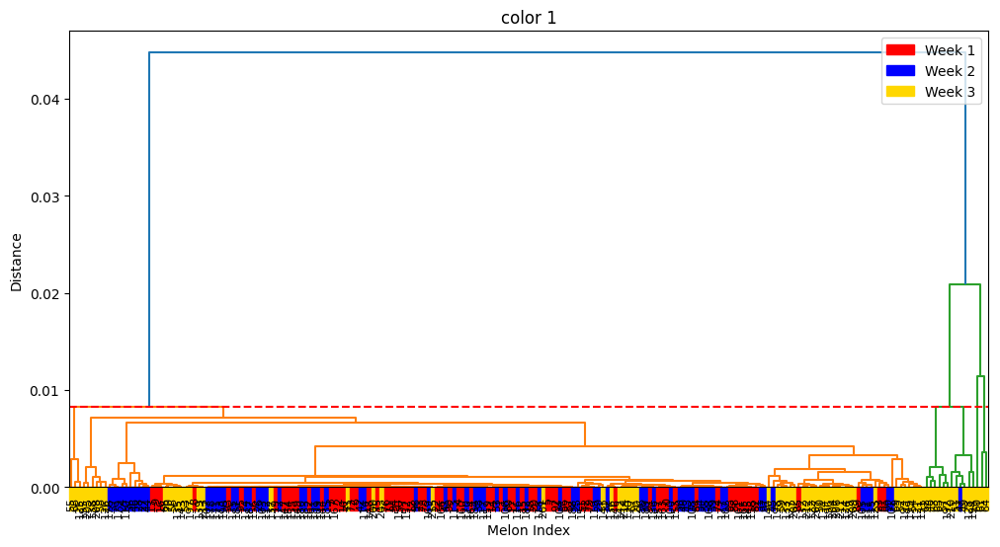

{0: 2, 1: 0, 2: 2, 3: 2, 4: 2}
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 3 3 3 1 3 1 1 1 3 1 3 1 1 3 3 3 3 3 3 1 1 3 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 3 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1]
[[72 71 55]
 [ 0  0  0]
 [ 0  1 17]]
0.412037037037


<Figure size 1000x500 with 0 Axes>

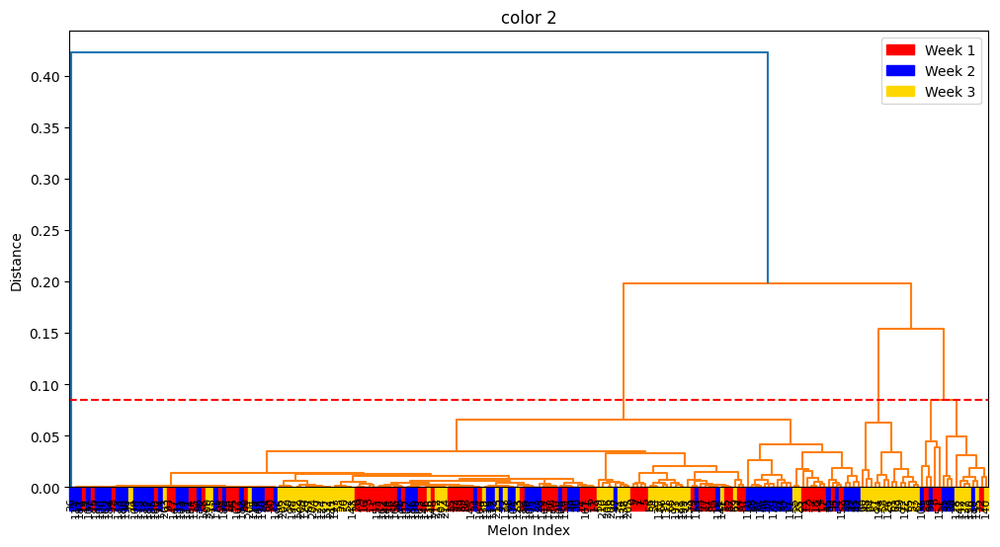

{0: 0, 1: 2, 2: 0, 3: 2, 4: 1}
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 3 1 1 1 1 2
 1 3 1 1 1 1 1 1 1 1 1 3 3 1 3 1 1 1 1 1 3 3 1 3 3 3 3 3 3 1 1 1 1 1 1 3 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 3 3 3 1 3 1 1 1 1 1 1 1 1 1 3 1 3 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 3 1 3 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[[71 67 52]
 [ 0  1  0]
 [ 1  4 20]]
0.425925925926


<Figure size 1000x500 with 0 Axes>

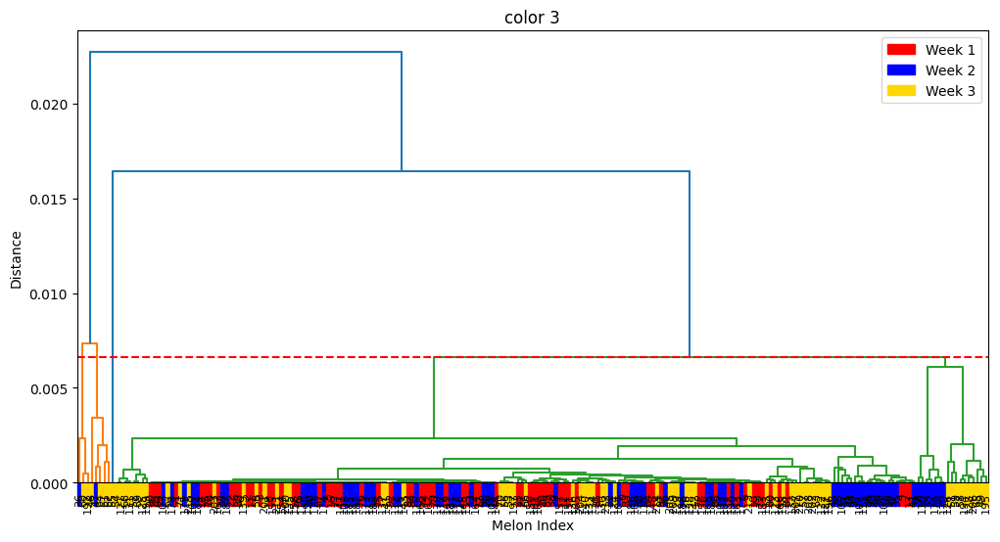

{0: 2, 1: 2, 2: 0, 3: 2, 4: 2}
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 3 3 1 1 1 1 1 1 1 3
 1 1 1 1 1 1 1 3 1 1 3 3 3 1 3 1 1 1 3 1 1 3 3 3 3 3 1 3 3 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 3 1 1 1 1 1
 1 1 1 1 1 1 1 3 1 3 3 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1]
[[72 63 55]
 [ 0  0  0]
 [ 0  9 17]]
0.412037037037


<Figure size 1000x500 with 0 Axes>

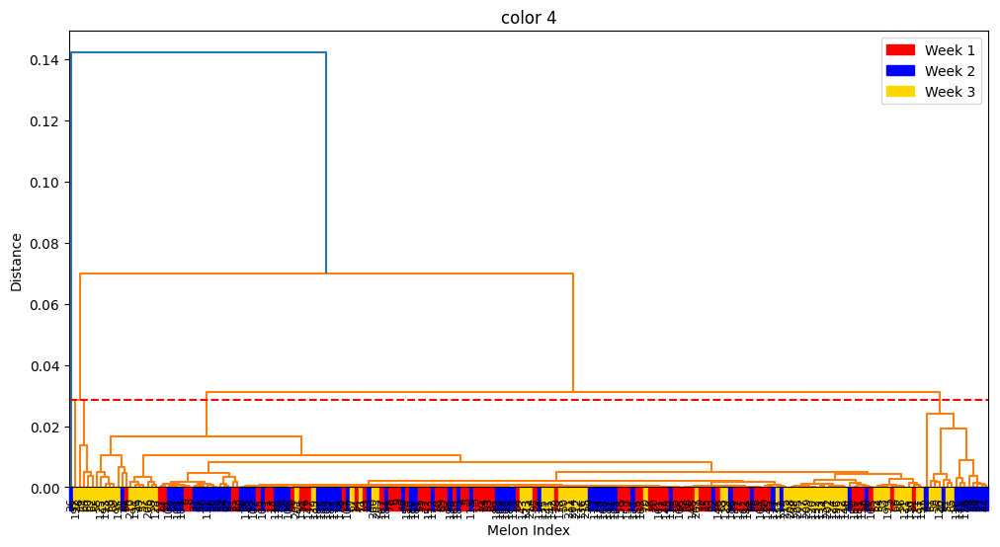

{0: 2, 1: 2, 2: 0, 3: 1, 4: 1}
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 1 1 1 1 1 1 1 2
 1 1 1 1 1 2 1 2 1 1 2 3 1 1 2 1 1 1 1 1 1 2 1 3 2 3 1 3 2 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 2
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1
 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[[72 61 62]
 [ 0 11  5]
 [ 0  0  5]]
0.407407407407


<Figure size 1000x500 with 0 Axes>

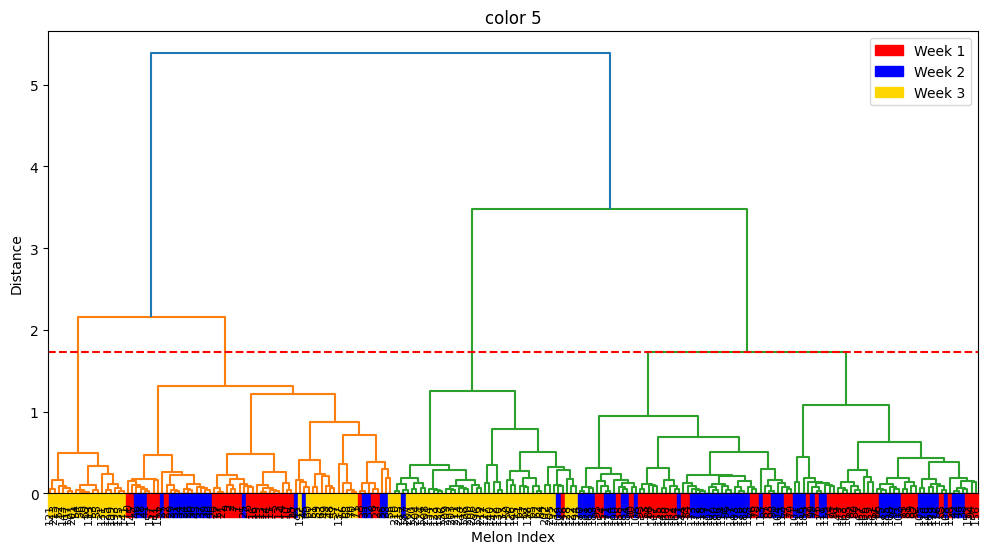

{0: 2, 1: 0, 2: 2, 3: 1, 4: 0}
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 3 3 3 3 3 1 1 1 1 3 3 1 3 3 1 3 1 3 1 1 1 1
 1 1 2 2 2 2 1 1 1 2 2 1 1 2 2 1 2 1 1 2 1 2 2 1 2 1 1 1 1 2 2 1 2 2 1 3 1
 1 2 2 2 2 1 2 2 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3 3 3 3 3 2 1 3 2
 2 1 1 1 1 2 2 2 1 1 2 1 2 1 2 1 2 1 1 1 2 1 2 2 2 2 2 1 1 2 2 1 2 2 2 2 2
 1 2 3 2 1 2 2 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
[[50 41 14]
 [21 29  0]
 [ 1  2 58]]
0.634259259259


<Figure size 1000x500 with 0 Axes>

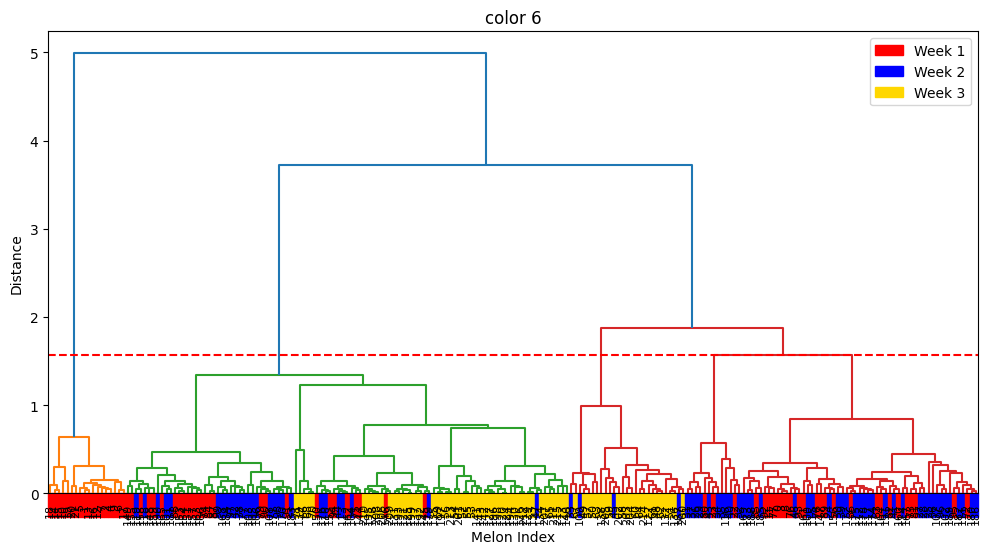

{0: 0, 1: 2, 2: 2, 3: 1, 4: 1}
[2 1 1 2 1 1 1 1 2 1 1 2 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 3 2 2 2
 2 3 2 2 2 3 2 3 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2
 3 3 2 2 2 3 2 2 2 2 3 2 2 3 3 2 3 3 2 2 3 2 2 3 3 3 2 3 2 3 3 3 3 2 3 3 3
 2 2 3 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2
 3 3 3 3 3 3 3 3 2 3 3 3 2 2 3 3 2 3 3 2 3 2 3 3 2 2 2 2 3 3 2 3 2 3 2 3 3
 2 2 3 2 2 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
[[18  0  0]
 [27 41  0]
 [27 31 72]]
0.606481481481


<Figure size 1000x500 with 0 Axes>

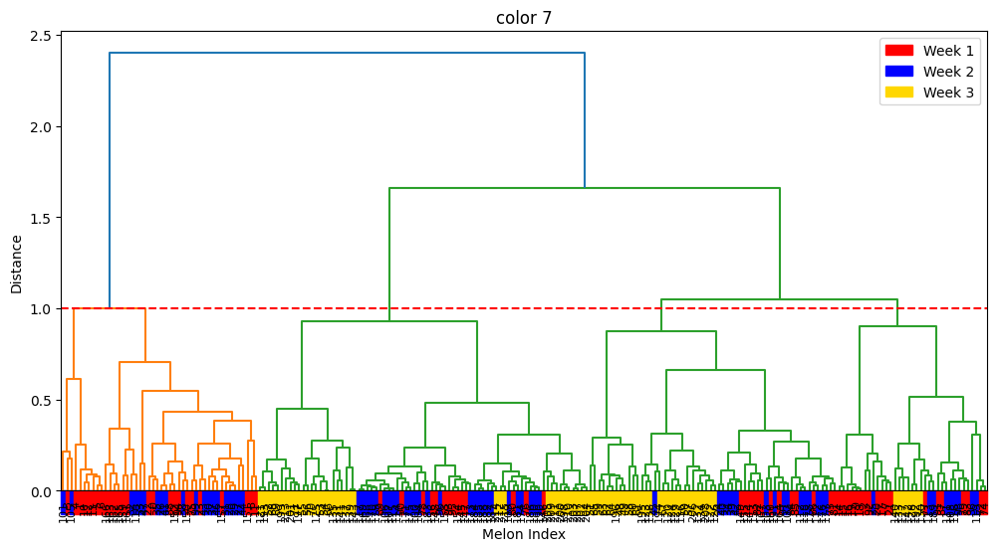

{0: 0, 1: 0, 2: 2, 3: 2, 4: 0}
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 3 1 1
 1 1 3 3 1 3 1 1 3 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3
 1 1 3 1 3 1 3 3 3 1 3 3 3 1 1 3 3 1 1 3 1 3 3 3 1 1 3 1 3 3 3 1 3 3 1 3 1
 1 3 1 3 3 1 3 3 1 3 3 3 3 3 3 3 1 1 3 1 3 3 1 3 3 3 3 3 3 1 3 1 3 3 3 3 3
 3 3 1 1 1 3 3 3 3 1 3 1 3 1 1 1 3 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 1 3 3 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
[[45 29  7]
 [ 0  0  0]
 [27 43 65]]
0.509259259259


<Figure size 1000x500 with 0 Axes>

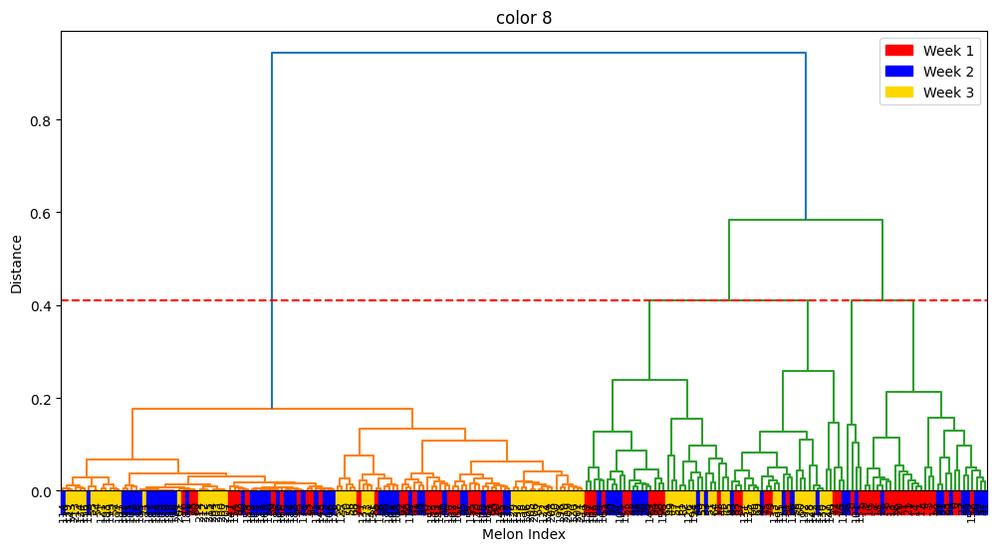

{0: 2, 1: 2, 2: 2, 3: 0, 4: 0}
[1 1 1 1 1 1 1 1 1 1 3 3 1 1 1 1 1 1 1 3 1 1 3 1 3 1 3 1 3 1 3 1 1 3 3 3 1
 3 1 1 3 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 1 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
[[22 11  0]
 [ 0  0  0]
 [50 61 72]]
0.435185185185


<Figure size 1000x500 with 0 Axes>

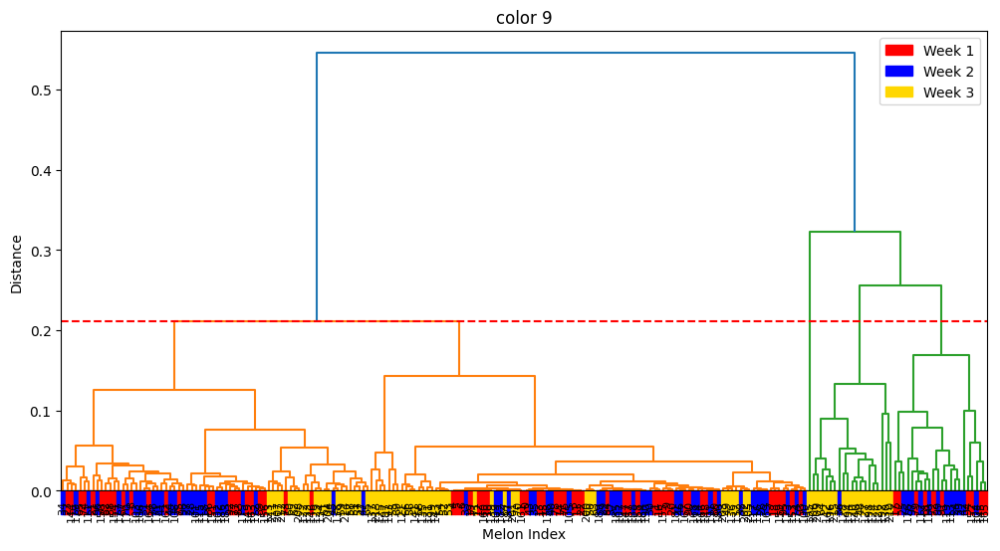

{0: 1, 1: 0, 2: 2, 3: 1, 4: 2}
[1 1 2 1 1 1 1 1 2 1 1 1 1 1 1 1 1 2 1 1 1 2 1 2 2 2 1 2 2 1 1 2 1 1 2 1 3
 1 2 2 1 2 2 1 2 2 1 2 3 1 1 2 1 1 1 1 1 2 2 2 2 2 2 1 3 2 1 1 1 1 1 1 2 2
 2 2 1 2 1 2 1 2 2 2 1 2 2 2 2 2 1 2 2 1 2 1 2 2 2 2 1 2 2 2 2 1 2 1 2 1 2
 2 2 2 1 2 1 1 2 2 3 1 2 2 3 1 3 3 3 2 3 1 1 2 2 1 1 1 2 1 3 1 3 1 2 2 2 1
 1 2 2 2 2 1 2 1 2 1 1 1 1 1 2 2 2 2 1 1 1 1 2 2 2 1 1 2 2 2 1 2 1 1 1 2 1
 1 2 1 1 1 1 1 3 1 3 3 3 1 3 1 1 1 1 1 2 1 3 2 2 3 3 2 2 1 2 3]
[[37 32 33]
 [35 39 20]
 [ 0  1 19]]
0.439814814815


<Figure size 1000x500 with 0 Axes>

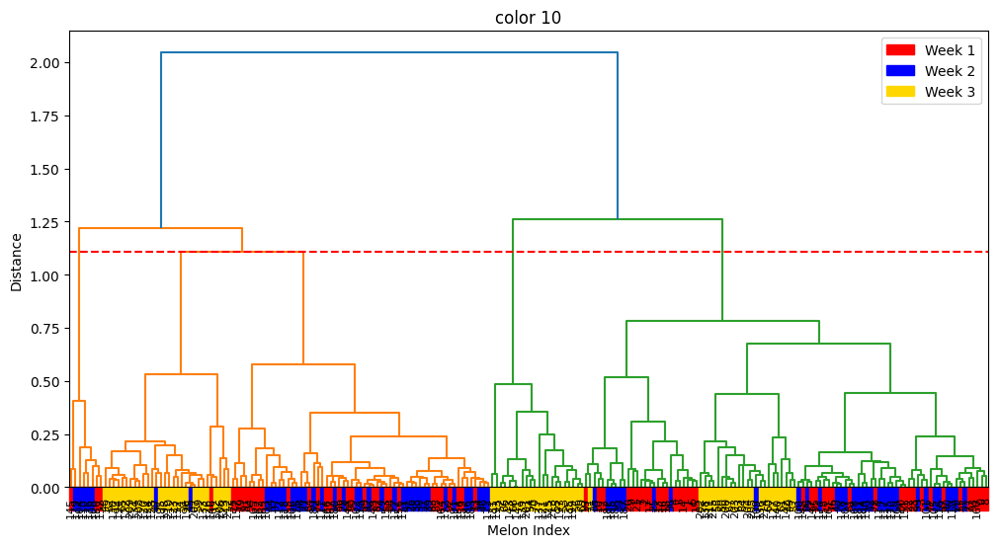

{0: 1, 1: 2, 2: 1, 3: 2, 4: 0}
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 2 2 1 2 2 1 1 2 1 1
 1 2 2 1 2 2 1 2 3 2 3 3 1 1 3 3 3 3 3 3 1 1 3 1 1 3 1 1 3 3 1 3 3 3 1 1 2
 2 2 1 1 1 2 1 1 2 2 2 2 2 1 2 2 2 2 2 1 2 1 1 2 2 1 1 1 2 2 2 1 2 1 2 1 2
 2 2 2 1 1 1 1 2 1 3 3 3 3 3 3 3 1 3 3 3 3 3 3 3 3 1 3 1 3 1 3 1 3 2 2 3 1
 1 2 2 1 2 2 2 2 2 2 1 2 1 1 2 2 2 2 2 2 1 1 1 2 2 2 1 2 2 2 1 2 2 1 1 2 1
 1 2 1 1 2 1 2 3 3 3 3 3 3 3 3 1 3 1 1 1 1 3 3 3 3 3 1 3 3 1 1]
[[39 33 23]
 [32 37  0]
 [ 1  2 49]]
0.578703703704


<Figure size 1000x500 with 0 Axes>

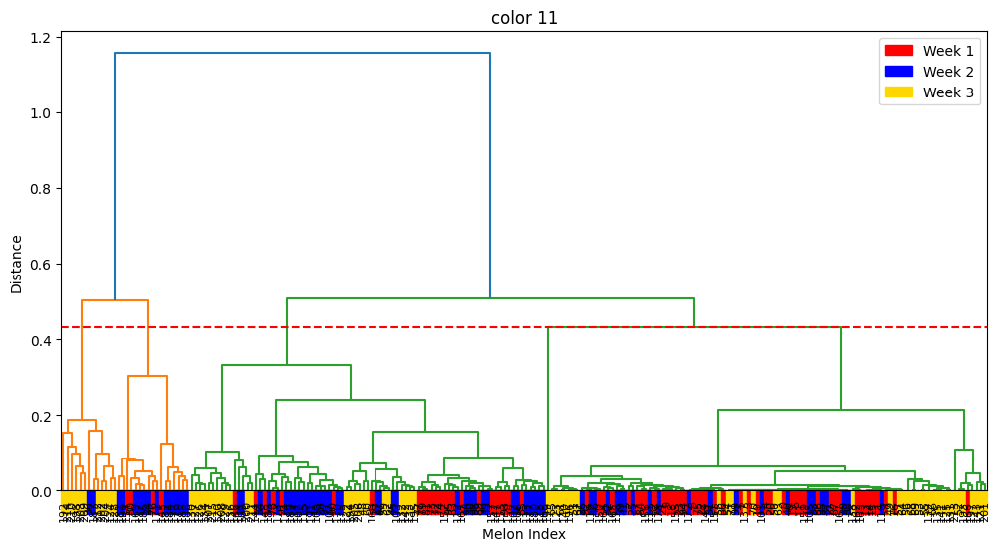

{0: 2, 1: 1, 2: 1, 3: 0, 4: 2}
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 1 2 1 1 1 2 1 3
 1 1 1 1 1 2 2 2 2 1 2 2 1 1 1 1 1 1 1 1 1 1 2 2 1 2 1 1 1 1 1 1 1 1 1 2 2
 2 1 2 2 2 2 2 2 1 2 1 2 1 1 1 2 2 2 1 2 1 2 2 2 2 1 2 1 2 2 2 1 2 2 2 2 1
 1 2 2 2 2 1 2 2 1 2 1 2 1 3 1 2 2 3 2 2 1 2 2 2 1 2 1 1 1 1 1 2 1 2 2 2 2
 2 1 1 1 2 2 2 1 1 2 2 1 2 1 1 1 1 1 1 2 2 2 2 2 1 2 2 2 2 2 1 2 2 2 2 2 2
 2 2 3 2 2 2 2 3 1 2 2 1 1 3 3 2 1 3 3 3 2 2 2 2 3 3 2 3 1 3 2]
[[44 22 36]
 [28 48 24]
 [ 0  2 12]]
0.481481481481


In [25]:
color_importance = np.zeros(12)
for color in range(12):
    dat = pts[:, range(color, 60, 12)]
    num_clusters = 5
    distance_matrix = sch.distance.pdist(dat, metric='euclidean')
    linkage_matrix = sch.linkage(distance_matrix, method='ward')
    cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
    # dendrogram
    plt.figure(figsize=(10, 5))
    fig, ax = plt.subplots(figsize=(12, 6))
    dendrogram_data = sch.dendrogram(linkage_matrix, leaf_rotation=90, leaf_font_size=8, ax=ax, labels=np.arange(len(dat)))
    leaf_labels = np.array(dendrogram_data['leaves'])
    xticks_positions = [tick.get_position()[0] for tick in ax.get_xticklabels()]
    yy = ax.get_ylim()[1]/20
    #print(ax.get_ylim())
    for x, sample_index in zip(xticks_positions, leaf_labels):
        rect = patches.Rectangle((x - 5, -yy), 10, yy, color=color_map[answers[sample_index]], transform=ax.transData, clip_on=False)
        ax.add_patch(rect)
    ax.set_xticklabels(leaf_labels, fontsize=8, rotation=90)
    plt.axhline(y=linkage_matrix[-(num_clusters - 1), 2], color='r', linestyle='--')
    handles = [patches.Patch(color=color, label=f"Week {cluster}") for cluster, color in color_map.items()]
    plt.legend(handles=handles, loc='upper right')
    plt.title(f"color {color}")
    plt.xlabel("Melon Index")
    plt.ylabel("Distance")
    plt.show()

    matched_pred_labels, cluster_mapping = match_clusters(answers-1, cluster_labels-1)
    print(cluster_mapping)
    print(matched_pred_labels+1)
    conf_mat = confusion_matrix(matched_pred_labels+1, answers)
    print(conf_mat)

    color_importance[color] = np.trace(conf_mat)/216
    print(color_importance[color])


In [34]:
color_importance

array([ 0.39351852,  0.41203704,  0.42592593,  0.41203704,  0.40740741,
        0.63425926,  0.60648148,  0.50925926,  0.43518519,  0.43981481,
        0.5787037 ,  0.48148148])

n =  9 Corrected : ( 170.0 / 216 )
 [[38  7  0]
 [33 60  0]
 [ 1  5 72]]
[[18  0  0  0  0  0  0  0  0]
 [ 4 13  0  0  0  0  0  0  0]
 [ 8  6  0  0  0  0  0  0  0]
 [ 5 12  0  0  0  0  0  0  0]
 [17 16  0  0  0  0  0  0  0]
 [19 18  0  0  0  0  0  0  0]
 [ 0  2 24  0  0  0  0  0  0]
 [ 1  1 27  0  0  0  0  0  0]
 [ 0  4 21  0  0  0  0  0  0]]


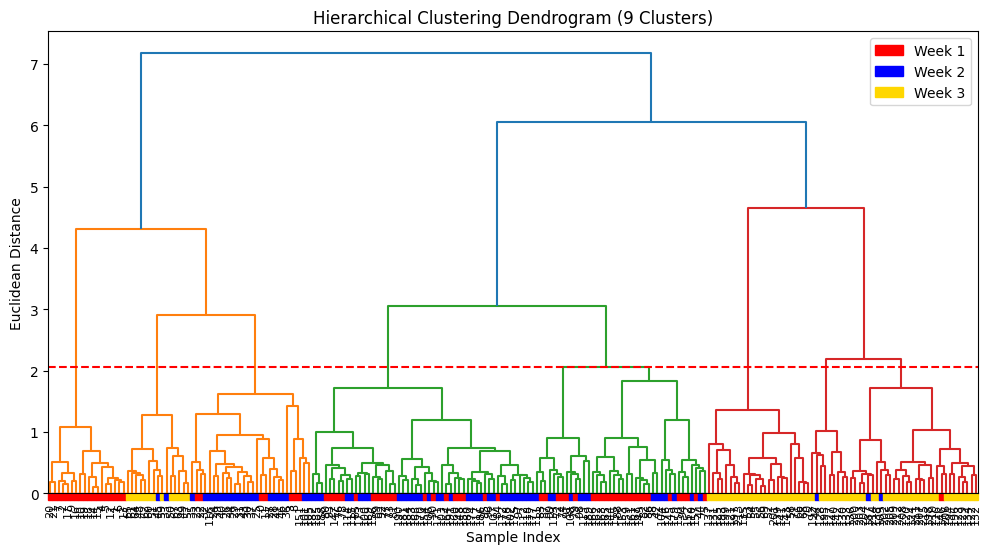

In [ ]:
#def get_confusion_matrix(linkage_matrix, num_clusters):
#    cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
#    matched_pred_labels, cluster_mapping = match_clusters(answers-1, cluster_labels-1)
#    return confusion_matrix(matched_pred_labels+1, answers)

n = 9
distance_matrix = np.zeros(23220)
for color in range(12):
    dat = pts[:, range(color, 60, 12)]
    distance_matrix += color_importance[color] * sch.distance.pdist(dat, metric='euclidean')

cluster_labels = fcluster(linkage_matrix, n, criterion='maxclust')

linkage_matrix = sch.linkage(distance_matrix, method='ward')
mat = get_confusion_matrix(linkage_matrix, n)
corrected[n] = np.trace(mat)
print("n = ", n, "Corrected : (", corrected[n], "/", np.sum(mat), ")\n", mat)

print(confusion_matrix(cluster_labels, answers))

fig, ax = plt.subplots(figsize=(12, 6))
dendrogram_data = sch.dendrogram(linkage_matrix, leaf_rotation=90, leaf_font_size=8, ax=ax)

leaf_labels = np.array(dendrogram_data['leaves'])

xticks_positions = [tick.get_position()[0] for tick in ax.get_xticklabels()]

for x, sample_index in zip(xticks_positions, leaf_labels):
    rect = patches.Rectangle((x - 5, -0.1), 10, 0.1, color=color_map[answers[sample_index]], transform=ax.transData, clip_on=False)
    ax.add_patch(rect)

ax.set_xticklabels(leaf_labels, fontsize=8, rotation=90)
plt.axhline(y=linkage_matrix[-(n - 1), 2], color='r', linestyle='--') 

# legend with color_map
handles = [patches.Patch(color=color, label=f"Week {cluster}") for cluster, color in color_map.items()]
plt.legend(handles=handles, loc='upper right')
plt.title(f"Hierarchical Clustering Dendrogram ({n} Clusters)")
plt.xlabel("Sample Index")
plt.ylabel("Euclidean Distance")
plt.show()

In [59]:
cluster_labels = fcluster(linkage_matrix, n, criterion='maxclust')
matched_pred_labels, cluster_mapping = match_clusters(answers-1, cluster_labels-1)
print(matched_pred_labels)
print(cluster_mapping)
print(np.where(cluster_labels == 1))
print(np.where(cluster_labels == 2))
print(np.where(cluster_labels == 3))
print(np.where(cluster_labels == 4))
print(np.where(cluster_labels == 5))
print(np.where(cluster_labels == 6))
print(np.where(cluster_labels == 7))
print(np.where(cluster_labels == 8))
print(np.where(cluster_labels == 9))

[1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1
 1 0 1 1 1 0 1 0 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1
 1 0 1 1 1 1 1 1 0 1 1 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 2 0
 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 2 1
 1 0 0 1 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1
 1 1 2 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
{0: 0, 1: 2, 2: 1, 3: 1, 4: 1, 5: 0, 6: 2, 7: 2, 8: 2}
(array([ 1,  2,  4,  5,  6,  7,  9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20,
       21]),)
(array([33, 45, 48, 49, 50, 51, 57, 59, 60, 61, 62, 63, 64, 65, 67]),)
(array([  0,   3,   8,  11,  22,  23,  24,  25,  26,  27,  28,  29,  30,
        31,  32,  34,  35,  36,  37,  39,  40,  41,  43,  46, 101, 105,
       116, 151]),)
(array([ 73,  76,  77,  78,  80,  81,  84,  85,  89,  90,  92,  93,  95,
        96,  97, 100, 102, 103, 106, 107, 112, 114, 115, 117, 118, 147,
       148, 154, 156, 158, 160, 164

## Using Top-3 Features

n =  9 Corrected : ( 159.0 / 216 )
 [[62 40  0]
 [ 9 25  0]
 [ 1  7 72]]
[[18  0  0  0  0  0  0  0  0]
 [ 0  2 13  0  0  0  0  0  0]
 [ 7 21  0  0  0  0  0  0  0]
 [20 32  0  0  0  0  0  0  0]
 [ 6  7  0  0  0  0  0  0  0]
 [20  7  0  0  0  0  0  0  0]
 [ 0  0 24  0  0  0  0  0  0]
 [ 0  1  8  0  0  0  0  0  0]
 [ 1  2 27  0  0  0  0  0  0]]


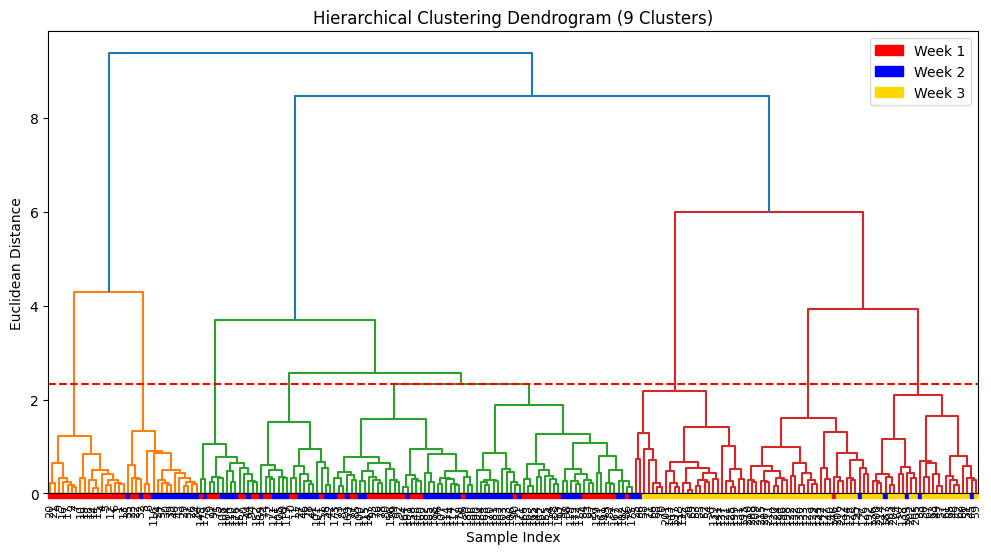

In [ ]:
#def get_confusion_matrix(linkage_matrix, num_clusters):
#    cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
#    matched_pred_labels, cluster_mapping = match_clusters(answers-1, cluster_labels-1)
#    return confusion_matrix(matched_pred_labels+1, answers)

n = 9
distance_matrix = np.zeros(23220)
for color in np.array([5, 6, 10]):
    dat = pts[:, range(color, 60, 12)]
    distance_matrix += sch.distance.pdist(dat, metric='euclidean')

cluster_labels = fcluster(linkage_matrix, n, criterion='maxclust')

linkage_matrix = sch.linkage(distance_matrix, method='ward')
mat = get_confusion_matrix(linkage_matrix, n)
corrected[n] = np.trace(mat)
print("n = ", n, "Corrected : (", corrected[n], "/", np.sum(mat), ")\n", mat)

print(confusion_matrix(cluster_labels, answers))

fig, ax = plt.subplots(figsize=(12, 6))
dendrogram_data = sch.dendrogram(linkage_matrix, leaf_rotation=90, leaf_font_size=8, ax=ax)

leaf_labels = np.array(dendrogram_data['leaves'])

xticks_positions = [tick.get_position()[0] for tick in ax.get_xticklabels()]

for x, sample_index in zip(xticks_positions, leaf_labels):
    rect = patches.Rectangle((x - 5, -0.1), 10, 0.1, color=color_map[answers[sample_index]], transform=ax.transData, clip_on=False)
    ax.add_patch(rect)

ax.set_xticklabels(leaf_labels, fontsize=8, rotation=90)
plt.axhline(y=linkage_matrix[-(n - 1), 2], color='r', linestyle='--')

# legend with color_map
handles = [patches.Patch(color=color, label=f"Week {cluster}") for cluster, color in color_map.items()]
plt.legend(handles=handles, loc='upper right')
plt.title(f"Hierarchical Clustering Dendrogram ({n} Clusters)")
plt.xlabel("Sample Index")
plt.ylabel("Euclidean Distance")
plt.show()

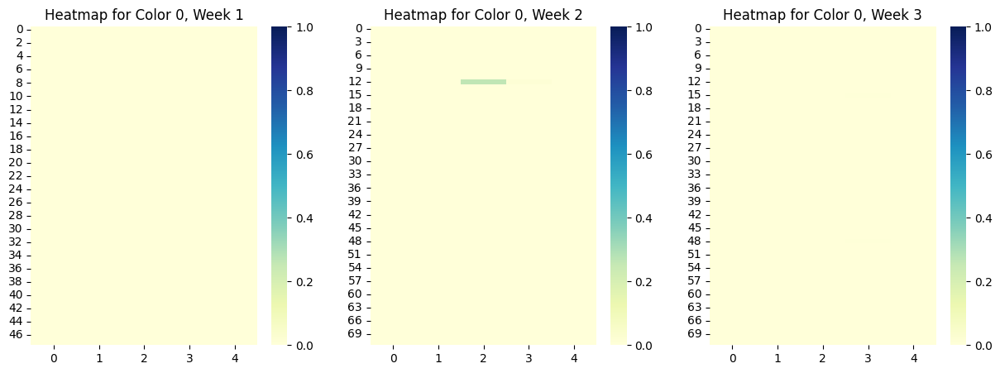

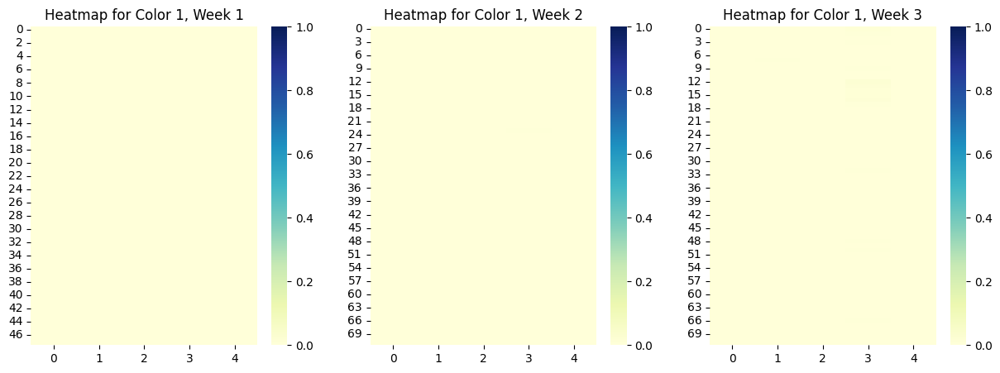

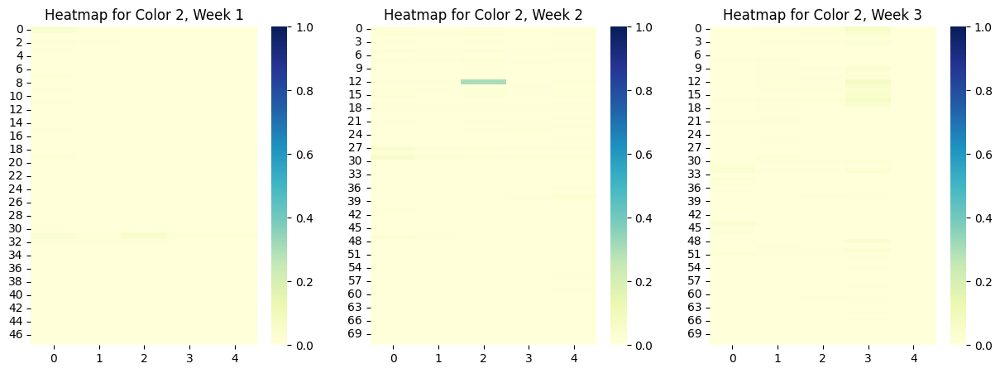

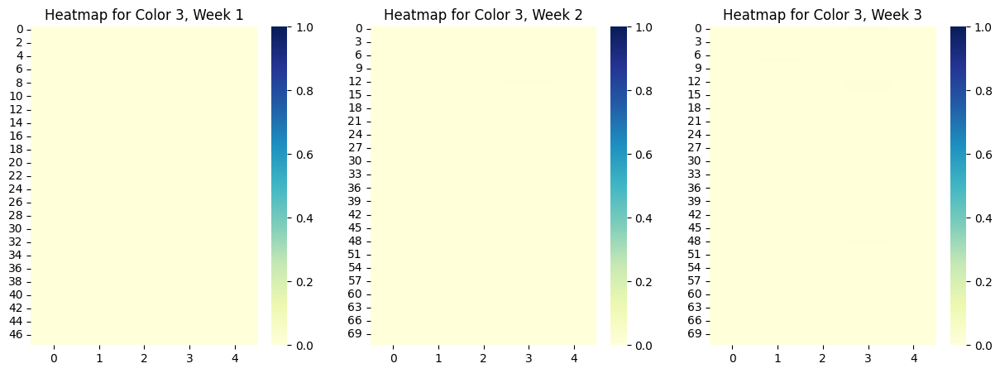

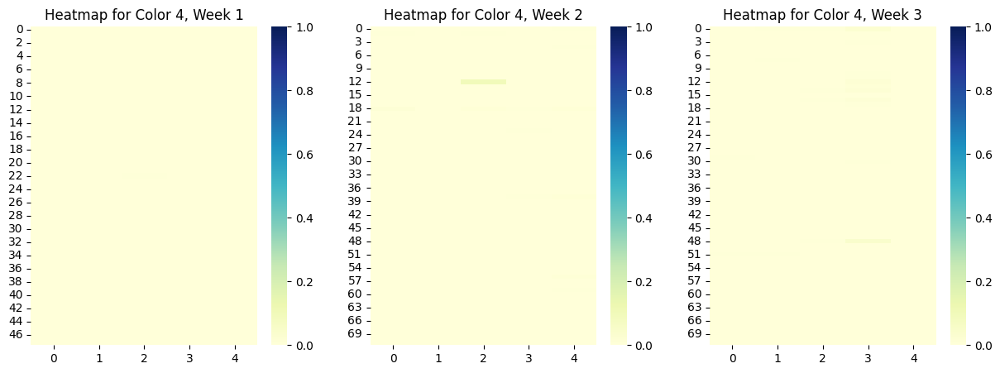

...

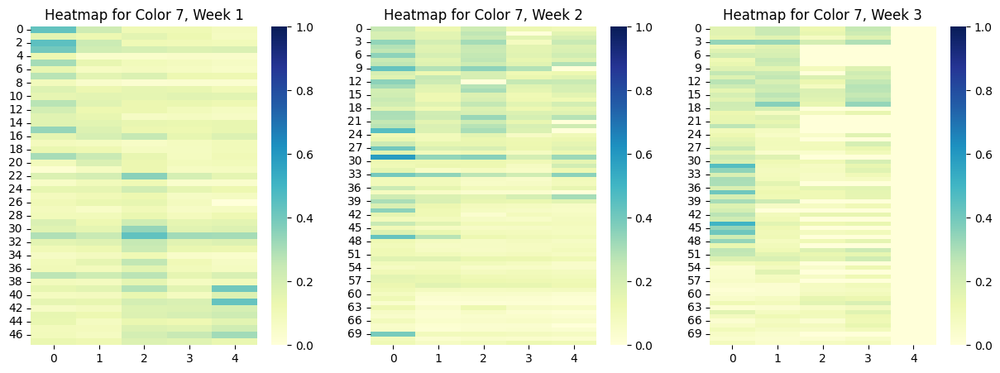

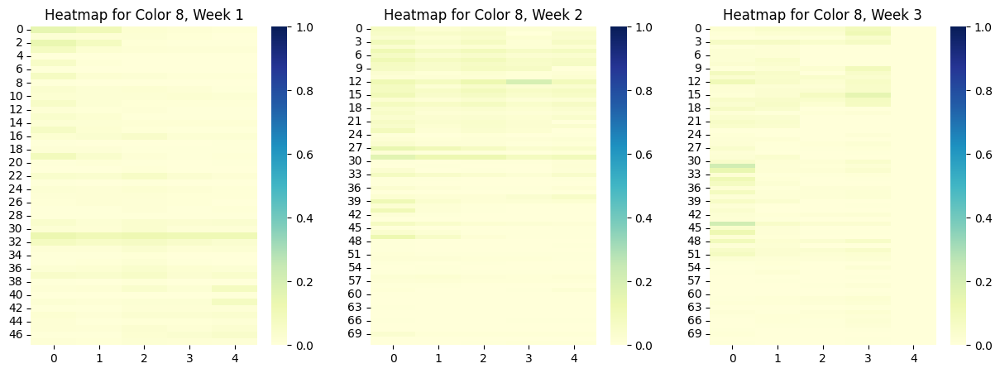

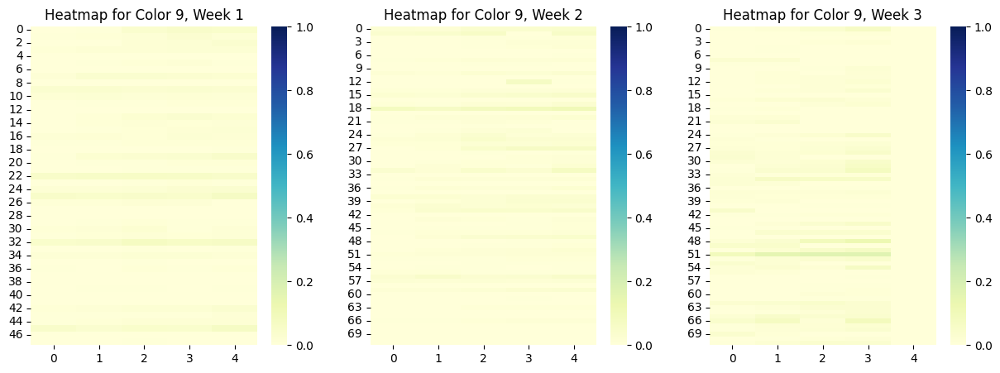

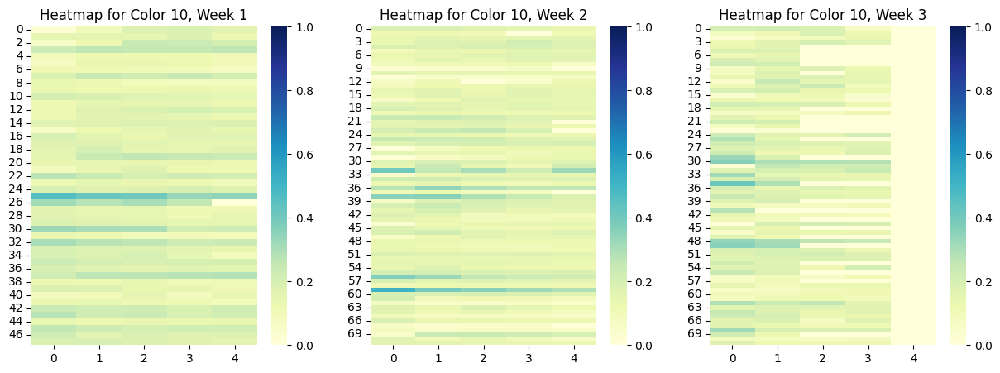

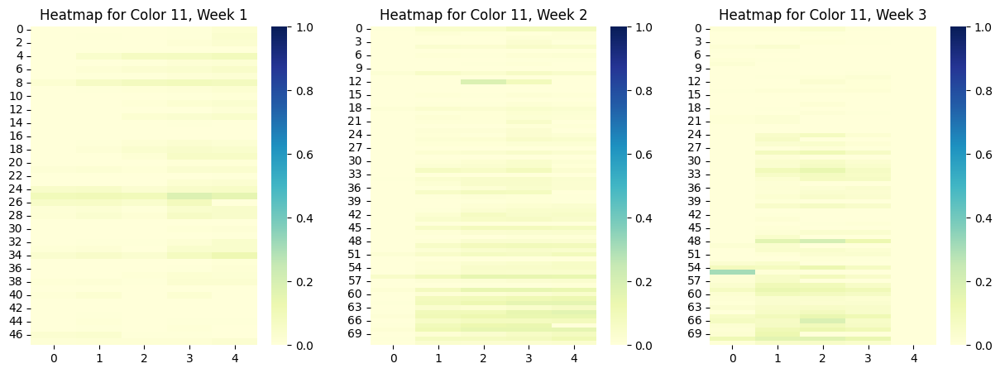

In [ ]:
import seaborn as sns

# heatmap of pts[:, range(color, 60, 12)]
for color in range(12):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for ansiter in range(1, 4):
        idxs = np.where(answers == ansiter)[0]
        if ansiter == 1:
            idxs = idxs[24:]
        dat = pts[idxs][:, range(color, 60, 12)]
        sns.heatmap(dat, cmap="YlGnBu", ax=axes[ansiter-1], vmin = 0, vmax = 1)
        axes[ansiter-1].set_title(f"Heatmap for Color {color}, Week {ansiter}")
    plt.show()

## 2. Using Arrived-Day

## 2-1. Cluster with Arrived-Day Images

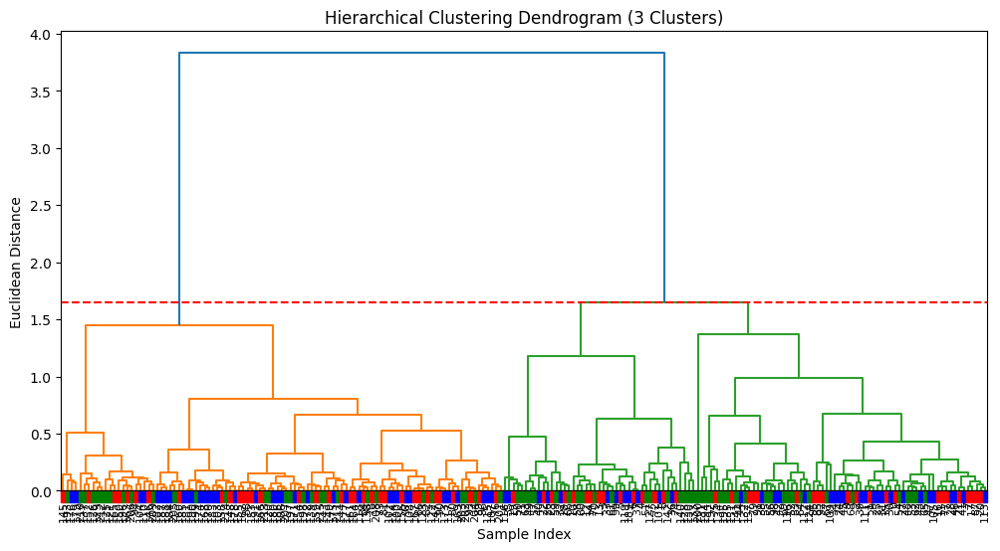

Cluster Labels (Total 3 Clusters):
{0: 1, 1: 2, 2: 1}
[2 2 2 3 3 3 3 2 3 2 3 2 3 3 3 2 2 2 3 3 2 2 3 3 2 2 3 2 2 2 2 2 3 3 2 3 3
 3 2 2 3 2 2 2 2 2 2 2 2 3 3 3 2 2 2 2 2 3 3 3 3 3 2 3 2 2 3 2 2 2 3 3 3 2
 3 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 2 3 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 3 2 2 3 2 2 2 2 2 2 2 3 3 2 3 2 2 3 2 2 2 2 2 2 3 2 3 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 3 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]


array([[ 0,  0,  0],
       [57, 60, 54],
       [15, 12, 18]])

In [ ]:
distance_matrix = sch.distance.pdist(ptsA, metric='euclidean')

linkage_matrix = sch.linkage(distance_matrix, method='ward')

num_clusters = 3
cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

answers = np.tile(np.repeat([1, 2, 3], 24), 3)

color_map = {1: "red", 2: "blue", 3: "green"}

fig, ax = plt.subplots(figsize=(12, 6))
dendrogram_data = sch.dendrogram(linkage_matrix, leaf_rotation=90, leaf_font_size=8, ax=ax)

leaf_labels = np.array(dendrogram_data['leaves'])

xticks_positions = [tick.get_position()[0] for tick in ax.get_xticklabels()]

for x, sample_index in zip(xticks_positions, leaf_labels):
    rect = patches.Rectangle((x - 5, -0.1), 10, 0.1, color=color_map[answers[sample_index]], transform=ax.transData, clip_on=False)
    ax.add_patch(rect)

ax.set_xticklabels(leaf_labels, fontsize=8, rotation=90)
plt.axhline(y=linkage_matrix[-(num_clusters - 1), 2], color='r', linestyle='--') 


plt.title("Hierarchical Clustering Dendrogram (3 Clusters)")
plt.xlabel("Sample Index")
plt.ylabel("Euclidean Distance")
plt.show()

print(f"Cluster Labels (Total {num_clusters} Clusters):")
# as.numpy cluster_labels
cluster_labels = np.array(cluster_labels)
#print(cluster_labels)

#print(answers)

matched_pred_labels, cluster_mapping = match_clusters(answers-1, cluster_labels-1)
print(cluster_mapping)
print(matched_pred_labels+1)
confusion_matrix(matched_pred_labels+1, answers)

# Data Preprocessing
- Exclude crops folder (except for that crops are only images)
- B60_T1_arrived..jpg -> add one more dot
- Remove A33-side_T1_nd_6dsl_week2.jpg
A59-side_T1_nd_4dsl_week3
A60-side_T1_nd_4dsl_week3.jpg
A61-side_T1_nd_4dsl_week3.jpg
A64-side_T1_nd_4dsl_week3.jpg
A68-side_T1_nd_4dsl_week3.jpg
A55-side_T1_nd_2dsl_week3.jpg
A53-side_T1_nd_2dsl_week3.jpg
A67-top_T1_nd_2dsl_week3.jpg
A72-side_T1_nd_2dsl_week3.jpg
A68-side_T1_nd_6dsl_week3.jpg
B09-side_T1_nd_2dsl_week1.jpg
B64-side_T1_nd_2dsl_week3.jpg
B68-side_T1_nd_2dsl_week3.jpg
B72-side_T1_nd_2dsl_week3.jpg
B09-side_T1_nd_4dsl_week1.jpg
B53-side_T1_nd_4dsl_week3.jpg
B57-side_T1_nd_4dsl_week3.jpg
B58-side_T1_nd_4dsl_week3.jpg
B61-side_T1_nd_4dsl_week3.jpg
B09_side_T1_nd_6dsl_week1.jpg
B38-side_T1_nd_6dsl_week2.jpg
B52-side_T1_nd_6dsl_week3.jpg
B53-side_T1_nd_6dsl_week3.jpg
B58-side_T1_nd_6dsl_week3.jpg
B61-side_T1_nd_6dsl_week3.jpg
B62-side_T1_nd_6dsl_week3.jpg
B63-side_T1_nd_6dsl_week3.jpg
B65-side_T1_nd_6dsl_week3.jpg
B67-side_T1_nd_6dsl_week3.jpg
B69-bottom_T1_nd_6dsl_week3.jpg
B71-top_T1_nd_6dsl_week3.jpg
B09_side_T1_nd_8dsl_week1.jpg
C70-side_T1_nd_0dsl_week3.jpg
C54-side_T1_nd_2dsl_week3.jpg
C56-top_T1_nd_2dsl_week3.jpg
C58-side_T1_nd_2dsl_week3.jpg
C70-side_T1_nd_2dsl_week3.jpg
C55-side_T1_nd_4dsl_week3.jpg
C57-side_T1_nd_4dsl_week3.jpg
C59-side_T1_nd_4dsl_week3.jpg
C60-side_T1_nd_4dsl_week3.jpg
C67-side_T1_nd_4dsl_week3.jpg
C67-side2_T1_nd_4dsl_week3.jpg
C69-side_T1_nd_4dsl_week3.jpg
C71-side_T1_nd_4dsl_week3.jpg
C72-side_T1_nd_4dsl_week3.jpg
C44-side_T1_nd_6dsl_week2.jpg
C49-side_T1_nd_6dsl_week3.jpg
C51-side_T1_nd_6dsl_week3.jpg
C52-side_T1_nd_6dsl_week3.jpg
C55-side_T1_nd_6dsl_week3.jpg
C57-side_T1_nd_6dsl_week3.jpg
C60-side_T1_nd_6dsl_week3.jpg
C61-side_T1_nd_6dsl_week3.jpg
C62-side_T1_nd_6dsl_week3.jpg
C64-side_T1_nd_6dsl_week3.jpg
C65-side_T1_nd_6dsl_week3.jpg
C67-side_T1_nd_6dsl_week3.jpg
C68-side_T1_nd_6dsl_week3.jpg
C69-side_T1_nd_6dsl_week3.jpg
C71-side_T1_nd_6dsl_week3.jpg
C71-side2_T1_nd_6dsl_week3.jpg
C72-side_T1_nd_6dsl_week3.jpg
C37-side_T1_nd_8dsl_week2.jpg